In [1]:
import os
import numpy as np
from scipy.stats import gaussian_kde
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
os.chdir('/home/ybhatti/yusufb/Scripts/')
from my_functions import *
os.chdir('/home/ybhatti/prjs1076/Emulator/PAPER_Plotting')
from PDFs import *
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

lats=xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PI/Processed/AOD_PPE.nc').lat
lons=xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PI/Processed/AOD_PPE.nc').lon
import cartopy.crs as ccrs
def find_diffs(run10,run1,axis1):
    t = stats.ttest_ind(run10,run1,axis=axis1, nan_policy='omit'); tt=t[1]
    diff = np.where(tt>0.05, 1, 0) #1 indicates it is not statistically significant; 0 indicates it is
    return diff

def blank_space (variable,min,max): # This creates a WHITE space close to the 0 MARK in the colour map.
    vari=np.empty((np.shape(variable)[0],np.shape(variable)[1])); vari[:]=np.nan
    for latty in range(0,np.shape(variable)[0]):
        for lonny in range(0,np.shape(variable)[1]):                
            vari[latty,lonny]=(variable[latty,lonny])
            if variable[latty,lonny]>min:
    #print(ovar[latty,lonny])
                if variable[latty,lonny] <max :
                    vari[latty,lonny]=np.nan
#                 else:
#                     vari[latty,lonny]=(variable[latty,lonny])
#             else:

    return vari

def Interpolate_Regional_uncertainty(Predicted,mask_number,Regions_nc):
    mask = Regions_nc == mask_number

    regional_array = Regions_nc.where(mask == True,drop=True)
    # Interpolate Predicted_Control to match the lat/lon grid of reg2
    Predicted_Control_interpolated = Predicted.interp(lat=regional_array.lat, lon=regional_array.lon, method="nearest")
    # Create a mask for values in reg2 equal to 5
    masks = regional_array == mask_number
    # Initialize a new array filled with NaNs, same shape as reg2
    new_array = xr.full_like(regional_array, np.nan, dtype=float)
    # Replace the '5' values in regional array with corresponding values from Predicted_Control_interpolated
    new_array = new_array.where(~masks, Predicted_Control_interpolated)
    return new_array




KeyboardInterrupt



## FIGURE 1 

In [3]:

sample_size = 1000  # Adjust this as needed

means_ERF = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/ERF_areaweighted_3000000.nc').__xarray_dataarray_variable__
means_ERF = means_ERF.sortby(means_ERF)
random_indices = np.random.choice(means_ERF.sample.size, sample_size, replace=False)
sampled_mean = means_ERF.isel(sample=random_indices)
kde_erf = gaussian_kde(sampled_mean, bw_method=1)
x_range_erf = np.linspace(means_ERF.min().item(), means_ERF.max().item(), sample_size)


means_ERFACI = xr.open_mfdataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/ERF_ACI_areaweighted_3000000.nc',combine='nested',concat_dim='sample').__xarray_dataarray_variable__.load()
means_ERFACI = means_ERFACI.sortby(means_ERFACI)
random_indices = np.random.choice(means_ERFACI.sample.size, sample_size, replace=False)
sampled_mean = means_ERFACI.isel(sample=random_indices)
kde_aci = gaussian_kde(sampled_mean, bw_method=1)  # Kernel Density Estimation
x_range_aci = np.linspace(means_ERFACI.min().item(), means_ERFACI.max().item(), sample_size)


means_ERFARI = xr.open_mfdataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/ERF_ARI_areaweighted_3000000.nc',combine='nested',concat_dim='sample').__xarray_dataarray_variable__.load()
means_ERFARI = means_ERFARI.sortby(means_ERFARI)
random_indices = np.random.choice(means_ERFARI.sample.size, sample_size, replace=False)
sampled_mean = means_ERFARI.isel(sample=random_indices)
kde_ari = gaussian_kde(sampled_mean, bw_method=1)  # Kernel Density Estimation
x_range_ari = np.linspace(means_ERFARI.min().item(), means_ERFARI.max().item(), sample_size)



means_ERF_cdnc_40 = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/ERF_areaweighted_3000000_CDNC_40.nc').__xarray_dataarray_variable__
means_ERFACI_cdnc_40 = xr.open_mfdataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/ERF_ACI_areaweighted_3000000_CDNC_40.nc',combine='nested',concat_dim='sample').__xarray_dataarray_variable__.load()
means_ERFARI_cdnc_40 = xr.open_mfdataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/ERF_ARI_areaweighted_3000000_CDNC_40.nc',combine='nested',concat_dim='sample').__xarray_dataarray_variable__.load()

means_ERF_cdnc_40 = means_ERF_cdnc_40.sortby(means_ERF_cdnc_40)
random_indices = np.random.choice(means_ERF_cdnc_40.sample.size, sample_size, replace=False)
sampled_mean_40 = means_ERF_cdnc_40.isel(sample=random_indices)
kde_erf_40 = gaussian_kde(sampled_mean_40, bw_method=1)  # Kernel Density Estimation
x_range_erf_40 = np.linspace(means_ERF_cdnc_40.min().item(), means_ERF_cdnc_40.max().item(), sample_size)


means_ERFACI_cdnc_40 = means_ERFACI_cdnc_40.sortby(means_ERFACI_cdnc_40)
random_indices = np.random.choice(means_ERFACI_cdnc_40.sample.size, sample_size, replace=False)
sampled_mean_40 = means_ERFACI_cdnc_40.isel(sample=random_indices)
kde_aci_40 = gaussian_kde(sampled_mean_40, bw_method=1)  # Kernel Density Estimation
x_range_aci_40 = np.linspace(means_ERFACI_cdnc_40.min().item(), means_ERFACI_cdnc_40.max().item(), sample_size)


means_ERFARI_cdnc_40 = means_ERFARI_cdnc_40.sortby(means_ERFARI_cdnc_40)
random_indices = np.random.choice(means_ERFARI_cdnc_40.sample.size, sample_size, replace=False)
sampled_mean_40 = means_ERFARI_cdnc_40.isel(sample=random_indices)
kde_ari_40 = gaussian_kde(sampled_mean_40, bw_method=1)  # Kernel Density Estimation
x_range_ari_40 = np.linspace(means_ERFARI_cdnc_40.min().item(), means_ERFARI_cdnc_40.max().item(), sample_size)

means_ERF_cdnc_10 = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/ERF_areaweighted_3000000_CDNC_10.nc').__xarray_dataarray_variable__
means_ERFACI_cdnc_10 = xr.open_mfdataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/ERF_ACI_areaweighted_3000000_CDNC_10.nc',combine='nested',concat_dim='sample').__xarray_dataarray_variable__.load()
means_ERFARI_cdnc_10 = xr.open_mfdataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/ERF_ARI_areaweighted_3000000_CDNC_10.nc',combine='nested',concat_dim='sample').__xarray_dataarray_variable__.load()


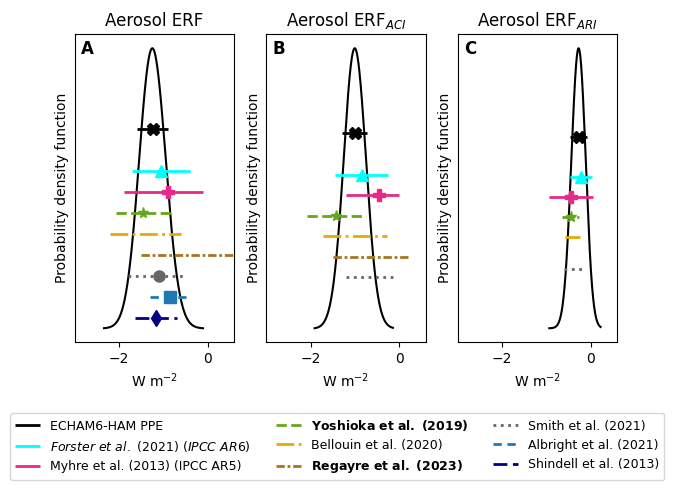

In [14]:
# Plotting
fig, axs = plt.subplots(1, 3, figsize=(7, 4))

ax = axs[0]
y_positions = [0.95, 0.85, 0.75, 0.65, 0.55, 0.45, 0.35, 0.25, 0.15, 0.05]  # Adjusted for better spacing

#ax.plot(x_range_erf, kde_erf(x_range_erf), color='black')  # Colorblind-friendly green

ax.plot(x_range_erf_40, kde_erf_40(x_range_erf_40), color='black')  # Colorblind-friendly green
ax.hlines(y=y_positions[0], xmin=np.percentile(means_ERF_cdnc_40,5), xmax=np.percentile(means_ERF_cdnc_40,95), 
          color='black', linestyle='-', linewidth=2, label='ECHAM6-HAM PPE')
ax.plot(np.percentile(means_ERF_cdnc_40,50), y_positions[0], 'X', color='black', markersize=8)
# -------------------------------------------------------
# ax.hlines(y=y_positions[1], xmin=np.percentile(means_ERF,5), xmax=np.percentile(means_ERF,95), 
#           color='#555555', linestyle='--', linewidth=2, label='ECHAM6-HAM PPE including cloud')
# ax.plot(np.percentile(means_ERF,50), y_positions[1], 'x', color='#555555', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[2], xmin=-1.71, xmax=-0.41, 
          color='#00ffff', linestyle='-', linewidth=2, label='$\mathit{Forster\ et\ al.\ (2021)\ (IPCC\ AR6)}$')
ax.plot(-1.06, y_positions[2], '^', color='#00ffff', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[3], xmin=-1.9, xmax=-0.1, 
          color='#e7298a', linestyle='-', linewidth=2, label='Myhre et al. (2013) (IPCC AR5)')
ax.plot(-0.9, y_positions[3], 'P', color='#e7298a', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[4], xmin=-2.07, xmax=-0.81, 
          color='#66a61e', linestyle='--', linewidth=2, label=r'$\mathbf{Yoshioka\ et\ al.\ (2019)}$')
ax.plot(-1.45, y_positions[4], '*', color='#66a61e', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[5], xmin=-2.2, xmax=-0.6, 
          color='#e6ab02', linestyle='-.', linewidth=2, label='Bellouin et al. (2020)')
# -------------------------------------------------------
ax.hlines(y=y_positions[6], xmin=-1.5, xmax=1, 
          color='#a6761d', linestyle=(0, (3, 1, 1, 1)), linewidth=2, label=r'$\mathbf{Regayre\ et\ al.\ (2023)}$')

# ax.hlines(y=y_positions[6], xmin=-2.18, xmax=-0.71, 
#           color='#a6761d', linestyle=(0, (3, 1, 1, 1)), linewidth=2, label=r'$\mathbf{Regayre\ et\ al.\ (2018)}$')

# -------------------------------------------------------
ax.hlines(y=y_positions[7], xmin=-1.8, xmax=-0.5, 
          color='#666666', linestyle=':', linewidth=2, label='Smith et al. (2021)') # 95%
ax.plot(-1.1, y_positions[7], 'o', color='#666666', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[8], xmin=-1.3, xmax=-0.5, 
          color='#1f78b4', linestyle=(0, (3, 2)), linewidth=2, label='Albright et al. (2021)')
ax.plot(-0.85, y_positions[8], 's', color='#1f78b4', markersize=8)
# -------------------------------------------------------
#ax.hlines(y=0.10, xmin=-1.44, xmax=-0.71, 
ax.hlines(y=y_positions[9], xmin=-1.65, xmax=-0.69, # from yoshioka dervived multimodel mean plus and minus standard deviation times 1.645
          color='navy', linestyle=(0, (5, 2)), linewidth=2, label='Shindell et al. (2013)') # multiple models
ax.plot(-1.17, y_positions[9], 'd', color='navy', markersize=8)


ax.set_title(f'Aerosol ERF')
n=1.16
y_positions = [0.95*n, 0.85*n, 0.75*n, 0.65*n, 0.55*n, 0.45*n, 0.35*n, 0.25*n, 0.15*n, 0.05*n]  # Adjusted for better spacing
ax = axs[1]
# ax.plot(x_range_aci, kde_aci(x_range_aci), color='black')  # Colorblind-friendly green

ax.plot(x_range_aci_40, kde_aci_40(x_range_aci_40), color='black')  # Colorblind-friendly green
ax.hlines(y=y_positions[0], xmin=np.percentile(means_ERFACI_cdnc_40,5), xmax=np.percentile(means_ERFACI_cdnc_40,95), 
          color='black', linestyle='-', linewidth=2)#, label='ECHAM')
ax.plot(np.percentile(means_ERFACI_cdnc_40,50), y_positions[0], 'X', color='black', markersize=8)
# -------------------------------------------------------
# ax.hlines(y=y_positions[1], xmin=np.percentile(means_ERFACI,5), xmax=np.percentile(means_ERFACI,95), 
#           color='#555555', linestyle='--', linewidth=2)#, label='ECHAM')
# ax.plot(np.percentile(means_ERFACI,50), y_positions[1], 'x', color='#555555', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[2], xmin=-1.45, xmax=-0.25, 
          color='#00ffff', linestyle='-', linewidth=2) # label='IPCC AR6')
ax.plot(-0.84, y_positions[2], '^', color='#00ffff', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[3], xmin=-1.2, xmax=-0.0, 
          color='#e7298a', linestyle='-', linewidth=2)# label='Myhre et al. (2013) (IPCC AR5)')
ax.plot(-0.45, y_positions[3], 'P', color='#e7298a', markersize=8)
# -------------------------------------------------------
# ax.hlines(y=0.15, xmin=-0.9, xmax=-0.2, 
#           color='#1f78b4', linestyle=(0, (5, 2)), linewidth=2)# label='Albright et al. (2021)')
ax.hlines(y=y_positions[4], xmin=-2.08, xmax=-0.74, 
          color='#66a61e', linestyle='--', linewidth=2)# label='Yoshioka et al. (2019)')
ax.plot(-1.42, y_positions[4], '*', color='#66a61e', markersize=8)
# -------------------------------------------------------

ax.hlines(y=y_positions[5], xmin=-1.73, xmax=-0.27,
          color='#e6ab02', linestyle='-.', linewidth=2)# label='Bellouin et al. (2019)')
# -------------------------------------------------------
ax.hlines(y=y_positions[6], xmin=-1.5, xmax=0.2, 
          color='#a6761d', linestyle=(0, (3, 1, 1, 1)), linewidth=2)# label='Regayre et al. (2023)')
# -------------------------------------------------------
ax.hlines(y=y_positions[7], xmin=-1.2, xmax=-0.1, 
          color='#666666', linestyle=':', linewidth=2)# label='Smith et al. (2021)')
# -------------------------------------------------------

ax.set_title(f'Aerosol ERF$_{{ACI}}$')
n=1.8

y_positions = [0.95*n, 0.85*n, 0.75*n, 0.65*n, 0.55*n, 0.45*n, 0.35*n, 0.25*n, 0.15*n, 0.05*n]  # Adjusted for better spacing

ax = axs[2]
#ax.plot(x_range_ari, kde_ari(x_range_ari), color='#555555')  # Colorblind-friendly green

ax.plot(x_range_ari_40, kde_ari_40(x_range_ari_40), color='black')  # Colorblind-friendly green
ax.hlines(y=y_positions[0], xmin=np.percentile(means_ERFARI_cdnc_40,5), xmax=np.percentile(means_ERFARI_cdnc_40,95), 
          color='black', linestyle='-', linewidth=2)#, label='ECHAM')
ax.plot(np.percentile(means_ERFARI_cdnc_40,50), y_positions[0], 'X', color='black', markersize=8)

# ax.hlines(y=y_positions[1], xmin=np.percentile(means_ERFARI,5), xmax=np.percentile(means_ERFARI,95), 
#           color='#555555', linestyle='--', linewidth=2)#, label='ECHAM')
# ax.plot(np.percentile(means_ERFARI,50), y_positions[1], 'x', color='#555555', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[2], xmin=-0.47, xmax=0.04, 
          color='#00ffff', linestyle='-', linewidth=2)
ax.plot(-0.22, y_positions[2], '^', color='#00ffff', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[3], xmin=-0.95, xmax=0.05, 
          color='#e7298a', linestyle='-', linewidth=2)# label='Myhre et al. (2013) (IPCC AR5)')
ax.plot(-0.45, y_positions[3], 'P', color='#e7298a', markersize=8)

# -------------------------------------------------------
# ax.hlines(y=0.15*n, xmin=-1, xmax=-0.1, 
#           color='#1f78b4', linestyle=(0, (5, 2)), linewidth=2)# label='Albright et al. (2021)')
ax.hlines(y=y_positions[4], xmin=-0.65, xmax=-0.27, 
          color='#66a61e', linestyle='--', linewidth=2)# label='Yoshioka et al. (2019)')
ax.plot(-0.45, y_positions[4], '*', color='#66a61e', markersize=8)
# -------------------------------------------------------
ax.hlines(y=y_positions[5], xmin=-0.57, xmax=-0.23,
          color='#e6ab02', linestyle='-.', linewidth=2)# label='Bellouin et al. (2019)')
# -------------------------------------------------------
# ax.hlines(y=y_positions[4], xmin=-0.19, xmax=0.13, 
#           color='#a6761d', linestyle=(0, (3, 1, 1, 1)), linewidth=2)# label='Regayre et al. (2023)')
# -------------------------------------------------------
ax.hlines(y=y_positions[6]-0.1, xmin=-0.6, xmax=-0.1, 
          color='#666666', linestyle=':', linewidth=2)# label='Smith et al. (2021)')
# -------------------------------------------------------

ax.set_title(f'Aerosol ERF$_{{ARI}}$')


labels = ["A", "B", "C"]
for ax, label in zip(axs, labels):
#for ax in axs:
    ax.set_yticks([])
    ax.set_xlim([-3, 0.6])
   # ax.set_ylim([0, 1.2])
    ax.set_xlabel(r'W m$^{-2}$')
    ax.set_ylabel(r'Probability density function')
    ax.text(0.04, 0.98, label, transform=ax.transAxes, fontsize=12, fontweight='bold', 
            va='top', ha='left')


#axs[2].set_xlim([-1, 0.6])

# Legend at the bottom with 2 rows and 3 columns
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.25), ncol=3, fontsize=9)
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PDF_ERF.png",dpi=100,bbox_inches = 'tight')
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PDF_ERF.pdf",dpi=100,bbox_inches = 'tight')

#plt.show()


In [2]:
Fig_2_file='/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40//'

variables = ['ERF_ACI', 'ERF_ARI', 'ERF']
types = ['uncertainty', 'areaweighted', 'mean']

# Use dictionary comprehension for clarity and efficiency
Fig_2 = {
    f"{var}_{typ}": xr.open_dataset(f"{Fig_2_file}{var}_{typ}_1000000.nc")
    for var in variables for typ in types
}
dimension = ['emulator','emulator','emulator',]

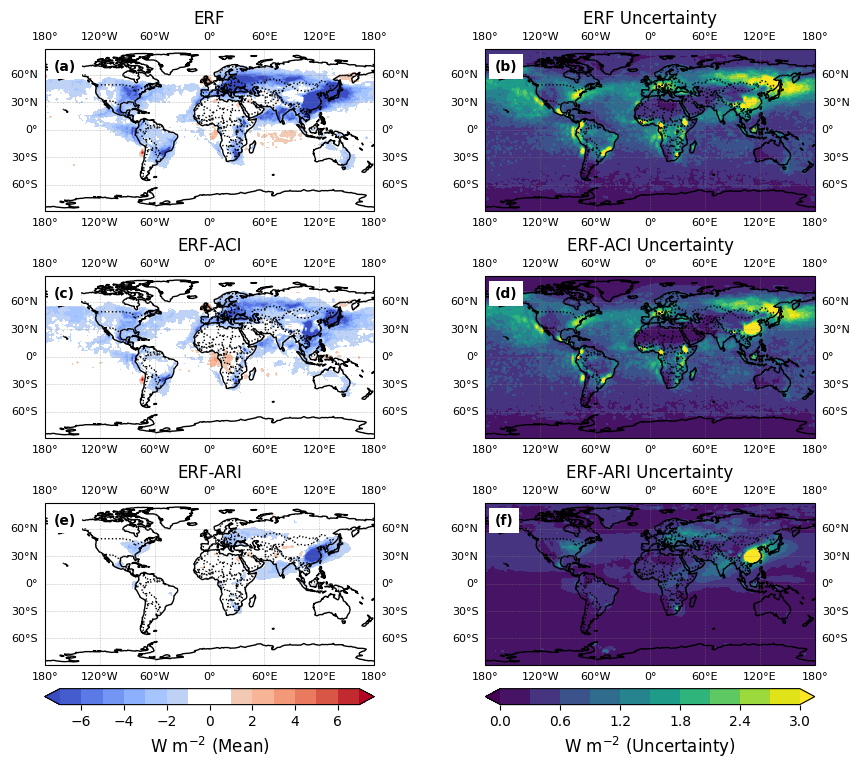

In [31]:
from matplotlib.colors import LinearSegmentedColormap

fig, ax = plt.subplots(3, 2, figsize=(12, 8),
                       gridspec_kw={'hspace': 0.4, 'wspace': -0.1},
                       subplot_kw={'projection': ccrs.PlateCarree()})

gridline_options = {
    'draw_labels': True,
    'linewidth': 0.4,
    'alpha': 0.5,
    'xlabel_style': {'size': 8},
    'ylabel_style': {'size': 8}
}

# Contour levels
clevs = np.arange(-7, 7 + 1, 1)  # Mean values
clevsstd = np.arange(0, 3 + 0.3, 0.3)  # Uncertainty values
coolwarm_data_diff = plt.cm.coolwarm(np.linspace(0, 1, 256))
viridis_white_data = plt.cm.viridis(np.linspace(0, 1, 256))

coolwarm_data_diff[110:146, :] = 1.0  # Set values from index 128 to 384 as white
coolwarm_white = LinearSegmentedColormap.from_list('coolwarm_white', coolwarm_data_diff)
viridis_white_data[:46, :] = 1.0  # Set values from index 128 to 384 as white
viridis_white_map = LinearSegmentedColormap.from_list('viridis_white_data', viridis_white_data)

# Variable names
variables = ['ERF', 'ERF_ACI', 'ERF_ARI']
# titles = ['ERF (a)', 'ERF-ACI (c)', 'ERF-ACI (e)']
# titles_uncert = ['ERF (b) Uncertainty', 'ERF-ARI (d) Uncertainty', 'ERF-ARI (f) Uncertainty']
titles = ['ERF', 'ERF-ACI', 'ERF-ARI']
titles_uncert = ['ERF Uncertainty', 'ERF-ACI Uncertainty', 'ERF-ARI Uncertainty']

dimension = ['emulator', 'emulator', 'emulator']
cmap_left = [coolwarm_white, coolwarm_white, coolwarm_white]
cmap_right = ['viridis', 'viridis', 'viridis']

# Labels for subplots (a) to (f)
subplot_labels = [['(a)', '(b)'], ['(c)', '(d)'], ['(e)', '(f)']]

# Store images for colorbars
im_left, im_right = [], []
count=1
for i, var in enumerate(variables):
    lower = Fig_2[f'{var}_mean'][f'Emulated {dimension[i]}'] - 1.645 * Fig_2[f'{var}_uncertainty'][f'Emulated {dimension[i]}']
    upper = Fig_2[f'{var}_mean'][f'Emulated {dimension[i]}'] + 1.645 * Fig_2[f'{var}_uncertainty'][f'Emulated {dimension[i]}']
    range_uncert = upper - lower

    cs1 = plot_map(ax[i, 0], Fig_2[f'{var}_mean'][f'Emulated {dimension[i]}'].data, 
                   lons, lats, cmap_left[i], clevs, f'{titles[i]}', 12, gridline_kwargs=gridline_options)
    
    cs2 = plot_map(ax[i, 1], Fig_2[f'{var}_uncertainty'][f'Emulated {dimension[i]}'].data*2, 
                   lons, lats, cmap_right[i], clevsstd, f'{titles_uncert[i]}', 12, gridline_kwargs=gridline_options)
    # cs2 = plot_map(ax[i, 1], range_uncert.data, 
    #                lons, lats, cmap_right[i], clevsstd, f'{titles_uncert[i]}', 12, gridline_kwargs=gridline_options)

    im_left.append(cs1)
    im_right.append(cs2)
    # Add subplot labels (a, b, c, d, e, f)
    ax[i, 0].text(-170, 65, subplot_labels[i][0], transform=ccrs.PlateCarree(),
                  fontsize=10, fontweight='bold', bbox=dict(facecolor='white', alpha=1., edgecolor='none'))
    ax[i, 1].text(-170, 65, subplot_labels[i][1], transform=ccrs.PlateCarree(),
                  fontsize=10, fontweight='bold', bbox=dict(facecolor='white', alpha=1., edgecolor='none'))

# Get exact width of subplots to match colorbars
pos_left = ax[-1, 0].get_position()
pos_right = ax[-1, 1].get_position()
bar_height = 0.02  # Colorbar thickness

# Left column colorbar
cbar_ax_left = fig.add_axes([pos_left.x0, pos_left.y0 - 0.05, pos_left.width, bar_height])
cbar_left = plt.colorbar(im_left[0], cax=cbar_ax_left, orientation='horizontal')
cbar_left.ax.tick_params(labelsize=10)
cbar_left.set_label(r'W m$^{-2}$ (Mean)', fontsize=12)

# Right column colorbar
cbar_ax_right = fig.add_axes([pos_right.x0, pos_right.y0 - 0.05, pos_right.width, bar_height])
cbar_right = plt.colorbar(im_right[0], cax=cbar_ax_right, orientation='horizontal')
cbar_right.ax.tick_params(labelsize=10)
cbar_right.set_label(r'W m$^{-2}$ (Uncertainty)', fontsize=12)

#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PPE_Map_ERF_2std.png",dpi=100,bbox_inches = 'tight')
#plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PPE_Map_ERF.pdf",dpi=300,bbox_inches = 'tight')


# Analysis of regional values for ERF - first section section (Fig 1 - 2)


In [12]:
#aci_all = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_ERF_ACI_3_million.nc')['Emulated emulator']
regions=xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/reg_18.nc').reg
regions_nn=xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/reg_18_regridded_nn.nc').reg
Region_Criteria = ["NA",
    "Arctic_Ocean", "Arctic_Land", "North_Pacific_Ocean", "North_America", 
    "North_Atlantic_Ocean", "Europe", "Asia", "Tropical_Pacific_Ocean", 
    "Tropical_Atlantic_Ocean", "Africa", "Tropical_Indian_Ocean", 
    "South_Pacific_Ocean", "South_America", "South_Atlantic_Ocean", 
    "South_Indian_Ocean", "Australia", "Antarctic_Ocean", "Antarctica","Global"
]

def Interpolate_Regional_uncertainty(Predicted,mask_number,Regions_nc):
    mask = Regions_nc == mask_number

    regional_array = Regions_nc.where(mask == True,drop=True)
    # Interpolate Predicted_Control to match the lat/lon grid of reg2
    Predicted_Control_interpolated = Predicted.interp(lat=regional_array.lat, lon=regional_array.lon, method="nearest")
    # Create a mask for values in reg2 equal to 5
    masks = regional_array == mask_number
    # Initialize a new array filled with NaNs, same shape as reg2
    new_array = xr.full_like(regional_array, np.nan, dtype=float)
    # Replace the '5' values in regional array with corresponding values from Predicted_Control_interpolated
    new_array = new_array.where(~masks, Predicted_Control_interpolated)
    return new_array



Arctic_Ocean


# Polder Comparison (Figure 3)

In [16]:
def randomly_sample_emsemble(data,n,):
    first_sample = data.isel(sample=0)
    # Step 2: Randomly sample n points from the remaining data
    # Exclude the first sample (index 0) when sampling
    remaining_samples = data.isel(sample=slice(1, None))  # Exclude the first sample
    random_indices = np.random.choice(remaining_samples.sample.size, size=n, replace=False)
    random_samples = remaining_samples.isel(sample=random_indices)
    
    # Step 3: Combine the first sample with the randomly sampled points
    sampled_data = xr.concat([first_sample, random_samples], dim="sample")
    # Step 4: Transpose the dimensions to (lat, lon, sample)
    sampled_data_transposed = sampled_data.transpose("sample","lat", "lon")

    return sampled_data_transposed

gp_prediction_ssa = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_SSA_Comparison_POLDER_CDNC_40_300000.nc')['Emulated __xarray_dataarray_variable__']#[:100000].load()
gp_prediction_aod = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_AOD_Comparison_POLDER_CDNC_40_300000.nc')['Emulated TAU_2D_550nm']#[:100000].load()
gp_prediction_ang = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_ANG_Comparison_POLDER_CDNC_40_300000.nc')['Emulated ANG_550nm_865nm']#[:100000].load()
SSA_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2010/SSA_PPE_Pre_Emulator.nc').mean('month').load().__xarray_dataarray_variable__
ANG_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2010/ANG_PPE_Pre_Emulator.nc').mean('month').load().ANG_550nm_865nm
AOD_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2010/AOD_PPE_Pre_Emulator.nc').mean('month').load().TAU_2D_550nm

gp_prediction_aod = randomly_sample_emsemble(gp_prediction_aod,50000)
gp_prediction_ssa = randomly_sample_emsemble(gp_prediction_ssa,50000)
gp_prediction_ang = randomly_sample_emsemble(gp_prediction_ang,50000)
gp_prediction_aod = xr.where(gp_prediction_aod == 0, np.nan, gp_prediction_aod)
gp_prediction_ssa = xr.where(gp_prediction_ssa == 0, np.nan, gp_prediction_ssa)
gp_prediction_ang = xr.where(gp_prediction_ang == 0, np.nan, gp_prediction_ang)

# AOD_PPE = AOD_PPE.fillna(0)
# SSA_PPE = SSA_PPE.fillna(0)
# ANG_PPE = ANG_PPE.fillna(0)
ssa_nanned = gp_prediction_ssa.where(~np.isnan(SSA_PPE[-1]))
aod_nanned = gp_prediction_aod.where(~np.isnan(AOD_PPE[-1]))
ang_nanned = gp_prediction_ang.where(~np.isnan(ANG_PPE[-1]))
POLDER_AOD = AOD_PPE[-1]
POLDER_SSA = SSA_PPE[-1]
POLDER_ANG = ANG_PPE[-1]

Fig_3_file='/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/'

variables = [ 'AOD', 'SSA', 'ANG']
types = ['uncertainty', 'areaweighted', 'mean']

# Use dictionary comprehension for clarity and efficiency
Fig_3 = {
    f"{var}_{typ}": xr.open_dataset(f"{Fig_3_file}{var}_{typ}_3_million.nc")
    for var in variables for typ in types
}
dimension = ['TAU_2D_550nm','emulator','Emulated ANG_550nm_865nm']

In [17]:
from scipy.stats import stats
from matplotlib.colors import LinearSegmentedColormap

n = 10000
POLDER_Data_SSA = SSA_PPE[-1].data.flatten()
POLDER_PPE_SSA  = gp_prediction_ssa.data.flatten()
flat_PPE_SSA = POLDER_PPE_SSA[~np.isnan(POLDER_PPE_SSA)]
obs_spatial_SSA = POLDER_Data_SSA[~np.isnan(POLDER_Data_SSA)]
dots_ssa=find_diffs(gp_prediction_ssa,SSA_PPE[-1],0)

POLDER_Data_AOD = AOD_PPE[-1].data.flatten()
POLDER_PPE_AOD  = gp_prediction_aod.data.flatten()
flat_PPE_AOD = POLDER_PPE_AOD[~np.isnan(POLDER_PPE_AOD)]
obs_spatial_AOD = POLDER_Data_AOD[~np.isnan(POLDER_Data_AOD)]
dots_aod=find_diffs(gp_prediction_aod,AOD_PPE[-1],0)

POLDER_Data_ANG = ANG_PPE[-1].data.flatten()
POLDER_PPE_ANG  = gp_prediction_ang.data.flatten()
flat_PPE_ANG = POLDER_PPE_ANG[~np.isnan(POLDER_PPE_ANG)]
obs_spatial_ANG = POLDER_Data_ANG[~np.isnan(POLDER_Data_ANG)]
dots_ang=find_diffs(gp_prediction_ang,ANG_PPE[-1],0)

coolwarm_data_diff = plt.cm.coolwarm(np.linspace(0, 1, 256))
coolwarm_data_diff[110:140, :] = 1.0  # Set values from index 128 to 384 as white
coolwarm_white = LinearSegmentedColormap.from_list('coolwarm_white', coolwarm_data_diff)


/scratch-local/ybhatti.11259089/ipykernel_3285823/2242164887.py:16: DeprecationWarning: Please import `ttest_ind` from the `scipy.stats` namespace; the `scipy.stats.stats` namespace is deprecated and will be removed in SciPy 2.0.0.
  t = stats.ttest_ind(run10,run1,axis=axis1, nan_policy='omit'); tt=t[1]
/scratch-local/ybhatti.11259089/ipykernel_3285823/2242164887.py:16: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  t = stats.ttest_ind(run10,run1,axis=axis1, nan_policy='omit'); tt=t[1]


/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 

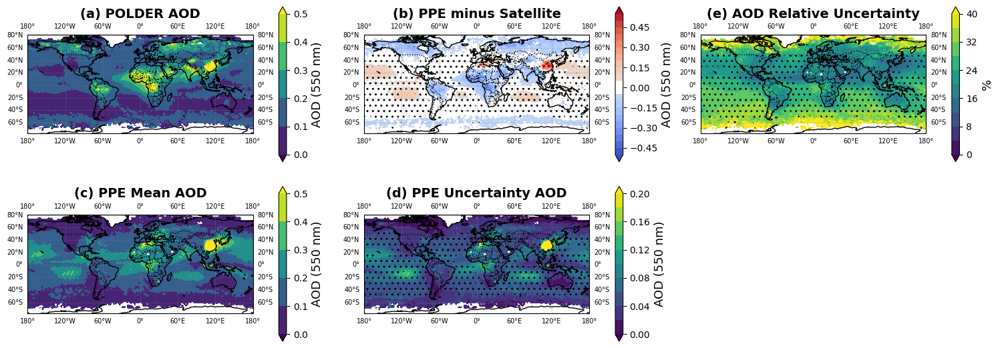

In [34]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Create figure
fig = plt.figure(figsize=(18, 12))

# Define grid for 3 rows, 3 columns with adjusted width ratios
grid = plt.GridSpec(3, 3, wspace=0.3, hspace=-0.3)

# Contour Levels
clevs_diff_aod = np.arange(-0.5, 0.5 + 0.1, 0.05)

clevs_diff_ssa = np.arange(-0.1, 0.1 + 0.01, 0.01)
clevs_diff_ang = np.arange(-0.5, 0.5 + 0.1, 0.05)
## AOD
clevs1 = np.arange(0, 0.5 + 0.1, 0.1)
clevsstd1 = np.arange(0, 1 + 0.1, 0.1)
clevs_std_aod = np.arange(0, 0.1 + 0.01, 0.01)
clevs_std_aod = np.arange(0, 0.2 + 0.02, 0.02)

## SSA
clevs5=np.arange(0.7,1+0.01,0.01)
clevsstd5=np.arange(0,0.1+0.02,0.01)
clevs_std_ssa = np.arange(0.032, 0.036 + 0.0001, 0.0001)

#ANG
clevs_ang=np.arange(0,2+0.2,0.2)
clevs_std_ang = np.arange(0, 0.15 + 0.01, 0.01)


clevs_var_aod = np.arange(0, 40 + 4, 4)   # Variability (std/mean)
clevs_var_ang = np.arange(6, 20 + 2, 2)   # Variability (std/mean)

diff_aod = aod_nanned.mean('sample') - AOD_PPE[-1]
diff_ssa = ssa_nanned.mean('sample') - SSA_PPE[-1]
diff_ang = ang_nanned.mean('sample') - ANG_PPE[-1]

# Compute std/mean for each variable
AOD_var = aod_nanned.std('sample') / aod_nanned.mean('sample') * 100
SSA_var = ssa_nanned.std('sample') / ssa_nanned.mean('sample') * 100
ANG_var = ang_nanned.std('sample') / ang_nanned.mean('sample') * 100

# Plot the variability (std/mean)
# plot_with_colorbar(var_axes[0], AOD_var, AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs_var_aod, '(d) AOD Relaitve Uncertainty','%')
# plot_with_colorbar(var_axes[1], SSA_var, SSA_PPE.lon, SSA_PPE.lat, 'viridis', None, '(e) SSA Relaitve Uncertainty','%')
# plot_with_colorbar(var_axes[2], ANG_var, ANG_PPE.lon, ANG_PPE.lat, 'viridis', clevs_var_ang, '(f) AE Relaitve Uncertainty','%')

# Define colormap
cmap_diff = 'coolwarm'  # Diverging colormap for differences
cmap_std = 'viridis'  # Per your request

coolwarm_data_diff = plt.cm.coolwarm(np.linspace(0, 1, 256))
coolwarm_data_diff[110:140, :] = 1.0  # Set values from index 128 to 384 as white
coolwarm_white = LinearSegmentedColormap.from_list('coolwarm_white', coolwarm_data_diff)

# Function to plot with colorbar (resized to fit subplot size)
def plot_with_colorbar(ax, data, lon, lat, cmap, clevs, title, Cbar_Title):
    img = plot_map(ax, data, lon, lat, cmap, clevs)  # Assuming plot_map returns an image
    cbar = plt.colorbar(img, ax=ax, orientation='vertical', fraction=0.03, pad=0.1)  # Increased pad
    cbar.ax.tick_params(labelsize=10)
    ax.set_title(title, fontsize=14, fontweight='bold')
    cbar.set_label(f'{Cbar_Title}',fontsize=13)

# Map Subplots for AOD (POLDER, PPE Mean, Relative Uncertainty)
map_axes = [
    fig.add_subplot(grid[0, 0], projection=ccrs.PlateCarree()),  # POLDER AOD
    fig.add_subplot(grid[0, 1], projection=ccrs.PlateCarree()),  # PPE Mean AOD
    fig.add_subplot(grid[1, 0], projection=ccrs.PlateCarree()),  # AOD Relative Uncertainty
    fig.add_subplot(grid[1, 1], projection=ccrs.PlateCarree()),  # PPE Uncertainty AOD
    fig.add_subplot(grid[0, 2], projection=ccrs.PlateCarree()),  # PPE AOD Diff
]

# Define color levels for AOD
# clevs_aod = np.arange(0, 0.5 + 0.1, 0.1)
# clevs_std_aod = np.arange(0, 1 + 0.1, 0.1)

lower = aod_nanned.mean('sample') - 1.645 * aod_nanned.std('sample')
upper = aod_nanned.mean('sample') + 1.645 * aod_nanned.std('sample')
range_uncert = upper - lower

# Plot the selected maps
plot_with_colorbar(map_axes[0], AOD_PPE[-1], AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs1, '(a) POLDER AOD', 'AOD (550 nm)')
plot_with_colorbar(map_axes[2], AOD_PPE.mean('ensemble'), AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs1, '(c) PPE Mean AOD', 'AOD (550 nm)')
plot_with_colorbar(map_axes[4], AOD_var, AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs_var_aod, '(e) AOD Relative Uncertainty', '%')
plot_with_colorbar(map_axes[3], aod_nanned.std('sample')*2, AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs_std_aod, '(d) PPE Uncertainty AOD', 'AOD (550 nm)')
#plot_with_colorbar(map_axes[3], abs(range_uncert), AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs1, '(d) PPE Uncertainty AOD', 'AOD (550 nm)')
plot_with_colorbar(map_axes[1], diff_aod, AOD_PPE.lon, AOD_PPE.lat, coolwarm_white, clevs_diff_aod, '(b) PPE minus Satellite', 'AOD (550 nm)')


# # Statistical Significance Overlay
for i, (dots, dataset) in enumerate([(dots_aod, AOD_PPE)]):
    
    # Getting indices of significant dots
    m, n = np.where(dots == 1)
    
    # Creating a mask for significant regions
    mask = np.zeros(dots.shape)
    mask[m, n] = 1  # Highlight statistically significant regions (1 for significance)
    
    # Accessing correct subplot axes (from map_axes)
    #ax_i = map_axes[2:]  # Targets the second column in each row
    ax_i = map_axes[4]  # Targets the second column in each row

    # Overlay contour for significance, using 'hatches' for highlighting
    ax_i.contourf(dataset.lon, dataset.lat, mask, 1, hatches=['', '..'], alpha=0)
    
# # Statistical Significance Overlay
for i, (dots, dataset) in enumerate([(dots_aod, AOD_PPE)]):
    
    # Getting indices of significant dots
    m, n = np.where(dots == 1)
    
    # Creating a mask for significant regions
    mask = np.zeros(dots.shape)
    mask[m, n] = 1  # Highlight statistically significant regions (1 for significance)
    
    # Accessing correct subplot axes (from map_axes)
    #ax_i = map_axes[2:]  # Targets the second column in each row
    ax_i = map_axes[1]  # Targets the second column in each row

    # Overlay contour for significance, using 'hatches' for highlighting
    ax_i.contourf(dataset.lon, dataset.lat, mask, 1, hatches=['', '..'], alpha=0)

# # Statistical Significance Overlay
for i, (dots, dataset) in enumerate([(dots_aod, AOD_PPE)]):
    
    # Getting indices of significant dots
    m, n = np.where(dots == 1)
    
    # Creating a mask for significant regions
    mask = np.zeros(dots.shape)
    mask[m, n] = 1  # Highlight statistically significant regions (1 for significance)
    
    # Accessing correct subplot axes (from map_axes)
    #ax_i = map_axes[2:]  # Targets the second column in each row
    ax_i = map_axes[3]  # Targets the second column in each row

    # Overlay contour for significance, using 'hatches' for highlighting
    ax_i.contourf(dataset.lon, dataset.lat, mask, 1, hatches=['', '..'], alpha=0)

# Adjust layout
plt.tight_layout()
#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PPE_Observation_Comparison_AOD_2010_2std.png",dpi=100,bbox_inches = 'tight')
#plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/PPE_Observation_Comparison_AOD_2010.pdf",dpi=300,bbox_inches = 'tight')


/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch-local/ybhatti.11259089/ipykernel_3285823/3730349280.py:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


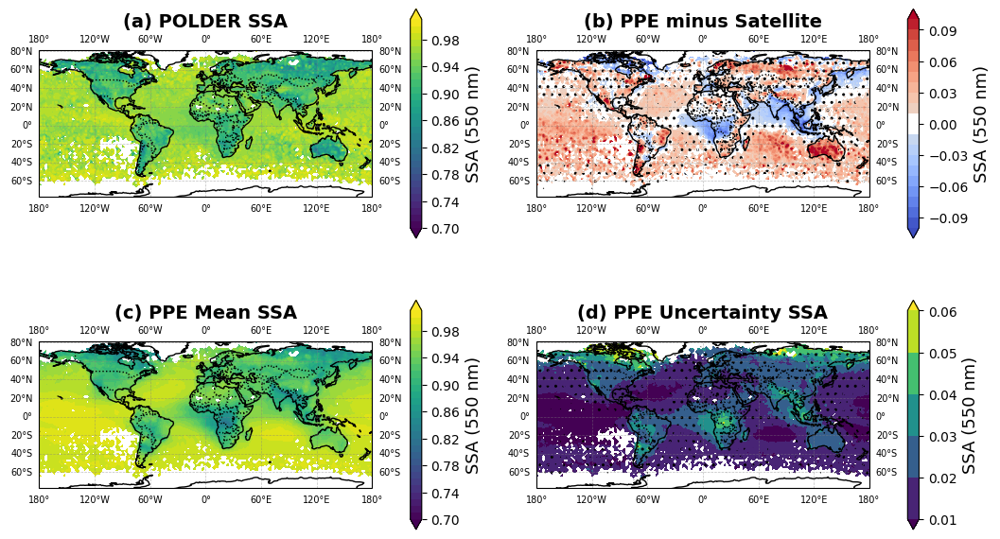

In [35]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# Create figure
fig = plt.figure(figsize=(12, 12))

# Define grid for 2 rows, 2 columns
grid = plt.GridSpec(2, 2, wspace=0.3, hspace=-0.5)

# Map Subplots
map_axes = [
    fig.add_subplot(grid[0, 0], projection=ccrs.PlateCarree()),  # POLDER SSA
    fig.add_subplot(grid[0, 1], projection=ccrs.PlateCarree()),  # PPE Mean SSA
    fig.add_subplot(grid[1, 0], projection=ccrs.PlateCarree()),  # PPE minus Satellite SSA
    fig.add_subplot(grid[1, 1], projection=ccrs.PlateCarree())   # PPE Uncertainty SSA
]

# Define color levels
clevs5 = np.arange(0.7, 1 + 0.01, 0.01)  # SSA
clevs_diff_ssa = np.arange(-0.1, 0.1 + 0.01, 0.01)

# Plot POLDER SSA
plot_with_colorbar(map_axes[0], SSA_PPE[-1], SSA_PPE.lon, SSA_PPE.lat, 'viridis', clevs5, '(a) POLDER SSA', 'SSA (550 nm)')

# Plot PPE Mean SSA
plot_with_colorbar(map_axes[2], ssa_nanned.mean('sample'), SSA_PPE.lon, SSA_PPE.lat, 'viridis', clevs5, '(c) PPE Mean SSA', 'SSA (550 nm)')

# Plot PPE minus Satellite SSA
plot_with_colorbar(map_axes[1], diff_ssa, SSA_PPE.lon, SSA_PPE.lat, coolwarm_white, clevs_diff_ssa, '(b) PPE minus Satellite', 'SSA (550 nm)')

# Plot PPE Uncertainty SSA
plot_with_colorbar(map_axes[3], ssa_nanned.std('sample')*2, SSA_PPE.lon, SSA_PPE.lat, 'viridis', None, '(d) PPE Uncertainty SSA', 'SSA (550 nm)')

# # Statistical Significance Overlay
for i, (dots, dataset) in enumerate([(dots_ssa, SSA_PPE)]):
    
    # Getting indices of significant dots
    m, n = np.where(dots == 1)
    
    # Creating a mask for significant regions
    mask = np.zeros(dots.shape)
    mask[m, n] = 1  # Highlight statistically significant regions (1 for significance)
    
    # Accessing correct subplot axes (from map_axes)
    #ax_i = map_axes[2:]  # Targets the second column in each row
    ax_i = map_axes[3]  # Targets the second column in each row

    # Overlay contour for significance, using 'hatches' for highlighting
    ax_i.contourf(dataset.lon, dataset.lat, mask, 1, hatches=['', '..'], alpha=0)
for i, (dots, dataset) in enumerate([(dots_ssa, SSA_PPE)]):
    
    # Getting indices of significant dots
    m, n = np.where(dots == 1)
    
    # Creating a mask for significant regions
    mask = np.zeros(dots.shape)
    mask[m, n] = 1  # Highlight statistically significant regions (1 for significance)
    
    # Accessing correct subplot axes (from map_axes)
    #ax_i = map_axes[2:]  # Targets the second column in each row
    ax_i = map_axes[1]  # Targets the second column in each row

    # Overlay contour for significance, using 'hatches' for highlighting
    ax_i.contourf(dataset.lon, dataset.lat, mask, 1, hatches=['', '..'], alpha=0)


# Adjust layout and save
plt.tight_layout()
#plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/SSA_Plots.png", dpi=300, bbox_inches='tight')
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PPE_Observation_Comparison_SSA_2010_2std.png",dpi=100,bbox_inches = 'tight')

#plt.show()

/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch-local/ybhatti.11259089/ipykernel_3285823/4065731051.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


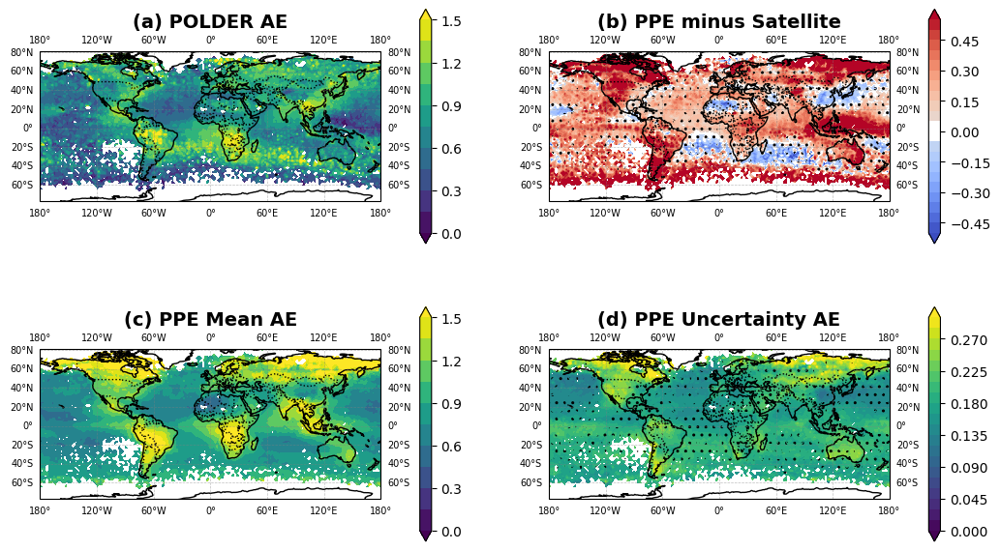

In [39]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# Create figure
fig = plt.figure(figsize=(12, 12))

# Define grid for 2 rows, 2 columns
grid = plt.GridSpec(2, 2, wspace=0.3, hspace=-0.5)

# Map Subplots
map_axes = [
    fig.add_subplot(grid[0, 0], projection=ccrs.PlateCarree()),  # POLDER AE
    fig.add_subplot(grid[0, 1], projection=ccrs.PlateCarree()),  # PPE Mean AE
    fig.add_subplot(grid[1, 0], projection=ccrs.PlateCarree()),  # PPE minus Satellite AE
    fig.add_subplot(grid[1, 1], projection=ccrs.PlateCarree())   # PPE Uncertainty AE
]

# Define color levels
clevs_ang = np.arange(0, 1.5 + 0.15, 0.15)  # AE
clevs_diff_ang = np.arange(-0.5, 0.5 + 0.1, 0.05)
clevs_std_ang = np.arange(0, 0.3 + 0.015, 0.015)

# Plot POLDER AE
plot_with_colorbar(map_axes[0], ANG_PPE[-1], ANG_PPE.lon, ANG_PPE.lat, 'viridis', clevs_ang, '(a) POLDER AE', '')

# Plot PPE Mean AE
plot_with_colorbar(map_axes[2], ang_nanned.mean('sample'), ANG_PPE.lon, ANG_PPE.lat, 'viridis', clevs_ang, '(c) PPE Mean AE', '')

# Plot PPE minus Satellite AE
plot_with_colorbar(map_axes[1], diff_ang, ANG_PPE.lon, ANG_PPE.lat, coolwarm_white, clevs_diff_ang, '(b) PPE minus Satellite', '')

# Plot PPE Uncertainty AE
plot_with_colorbar(map_axes[3], ang_nanned.std('sample')*2, ANG_PPE.lon, ANG_PPE.lat, 'viridis', clevs_std_ang, '(d) PPE Uncertainty AE', '')

# # Statistical Significance Overlay
for i, (dots, dataset) in enumerate([(dots_ang, ANG_PPE)]):
    
    # Getting indices of significant dots
    m, n = np.where(dots == 1)
    
    # Creating a mask for significant regions
    mask = np.zeros(dots.shape)
    mask[m, n] = 1  # Highlight statistically significant regions (1 for significance)
    
    # Accessing correct subplot axes (from map_axes)
    #ax_i = map_axes[2:]  # Targets the second column in each row
    ax_i = map_axes[1]  # Targets the second column in each row

    # Overlay contour for significance, using 'hatches' for highlighting
    ax_i.contourf(dataset.lon, dataset.lat, mask, 1, hatches=['', '..'], alpha=0)

# # Statistical Significance Overlay
for i, (dots, dataset) in enumerate([(dots_ang, ANG_PPE)]):
    
    # Getting indices of significant dots
    m, n = np.where(dots == 1)
    
    # Creating a mask for significant regions
    mask = np.zeros(dots.shape)
    mask[m, n] = 1  # Highlight statistically significant regions (1 for significance)
    
    # Accessing correct subplot axes (from map_axes)
    #ax_i = map_axes[2:]  # Targets the second column in each row
    ax_i = map_axes[3]  # Targets the second column in each row

    # Overlay contour for significance, using 'hatches' for highlighting
    ax_i.contourf(dataset.lon, dataset.lat, mask, 1, hatches=['', '..'], alpha=0)


# Adjust layout and save
plt.tight_layout()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PPE_Observation_Comparison_ANG_2010_2std.png", dpi=100, bbox_inches='tight')
#plt.show()

# Figure 4

In [2]:
# Load region masks
regions_nn = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/reg_18_regridded_nn.nc').reg
# Stack lat and lon into one dimension to sample from all spatial locations

# Load datasets for AOD, SSA, and ANG
gp_prediction_aod = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_AOD_Comparison_POLDER_CDNC_40_300000.nc')['Emulated TAU_2D_550nm']#[:100000].load()
random_samples = np.random.choice(gp_prediction_aod.sizes["sample"], size=30000, replace=False)
gp_prediction_aod = gp_prediction_aod.isel(sample=random_samples)
AOD_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2009/AOD_PPE_Pre_Emulator.nc').mean('time').load().TAU_2D_550nm
POLDER_AOD = AOD_PPE[-1]
aod_nanned = gp_prediction_aod.where(~np.isnan(POLDER_AOD))

# Load SSA Data
gp_prediction_ssa = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_SSA_Comparison_POLDER_CDNC_40_300000.nc')['Emulated __xarray_dataarray_variable__']#[:100000].load()
gp_prediction_ssa = gp_prediction_ssa.isel(sample=random_samples)
SSA_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2009/SSA_PPE_Pre_Emulator.nc').mean('time').load().__xarray_dataarray_variable__
POLDER_SSA = SSA_PPE[-1]
ssa_nanned = gp_prediction_ssa.where(~np.isnan(POLDER_SSA))

# Load ANG Data
gp_prediction_ang = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_ANG_Comparison_POLDER_CDNC_40_300000.nc')['Emulated ANG_550nm_865nm']#[:100000].load()
gp_prediction_ang = gp_prediction_ang.isel(sample=random_samples)
ANG_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2009/ANG_PPE_Pre_Emulator.nc').mean('time').load().ANG_550nm_865nm
POLDER_ANG = ANG_PPE[-1]
ang_nanned = gp_prediction_ang.where(~np.isnan(POLDER_ANG))


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr


# Define regions and their corresponding numerical indices
regions_cat = {
    "Arctic Ocean": 1, "Arctic Land": 2, "North Pacific Ocean": 3, "North America": 4,
    "North Atlantic Ocean": 5, "Europe": 6, "Asia": 7, "Tropical Pacific Ocean": 8,
    "Tropical Atlantic Ocean": 9, "Africa": 10, "Tropical Indian Ocean": 11,
    "South Pacific Ocean": 12, "South America": 13, "South Atlantic Ocean": 14,
    "South Indian Ocean": 15, "Australia": 16, "Antarctic Ocean": 17, "Antarctica": 18,
    "Global": 19
}

# Prepare data storage
boxplot_data_aod, boxplot_data_ssa, boxplot_data_ang = [], [], []
polder_means_aod, polder_means_ssa, polder_means_ang = [], [], []
boxplot_data_aod_control, boxplot_data_ssa_control, boxplot_data_ang_control = [], [], []

# Loop through each region to compute statistics
for region_name, r in regions_cat.items():
    # AOD Processing
    region_gp_aod = Interpolate_Regional_uncertainty(aod_nanned, r, regions_nn).transpose("sample", "lat", "lon")
    gpmeans_aod = areaweight(region_gp_aod, region_gp_aod.lat)
    gpmeans_aod[gpmeans_aod < 0] = 0
    boxplot_data_aod.append(gpmeans_aod.values)
    boxplot_data_aod_control.append(gpmeans_aod[0].values)

    region_obs_aod = Interpolate_Regional_uncertainty(POLDER_AOD, r, regions_nn).transpose("lat", "lon")
    polder_means_aod.append(areaweight(region_obs_aod, region_obs_aod.lat).values)
    
    # SSA Processing
    region_gp_ssa = Interpolate_Regional_uncertainty(ssa_nanned, r, regions_nn).transpose("sample", "lat", "lon")
    gpmeans_ssa = areaweight(region_gp_ssa, region_gp_ssa.lat)
    gpmeans_ssa[gpmeans_ssa > 1] = 1
    boxplot_data_ssa.append(gpmeans_ssa.values)
    boxplot_data_ssa_control.append(gpmeans_ssa[0].values)

    region_obs_ssa = Interpolate_Regional_uncertainty(POLDER_SSA, r, regions_nn).transpose("lat", "lon")
    polder_means_ssa.append(areaweight(region_obs_ssa, region_obs_ssa.lat).values)

    # ANG Processing
    region_gp_ang = Interpolate_Regional_uncertainty(ang_nanned, r, regions_nn).transpose("sample", "lat", "lon")
    gpmeans_ang = areaweight(region_gp_ang, region_gp_ang.lat)
    boxplot_data_ang.append(gpmeans_ang.values)
    boxplot_data_ang_control.append(gpmeans_ang[0].values)

    region_obs_ang = Interpolate_Regional_uncertainty(POLDER_ANG, r, regions_nn).transpose("lat", "lon")
    polder_means_ang.append(areaweight(region_obs_ang, region_obs_ang.lat).values)
    print(r)
    if r == 18: # Breaking the 18th region for GLOBAL
        break
    # all_nan_mask = region_gp_ang.isnull().all(dim=("lat", "lon"))
    # gpmeans_ang = areaweight(region_gp_ang, region_gp_ang.lat)
    # gpmeans_ang = gpmeans_ang.where(~all_nan_mask)

# Ensure global statistics are included
boxplot_data_aod.append(areaweight(aod_nanned, aod_nanned.lat).values)
polder_means_aod.append(areaweight(POLDER_AOD, POLDER_AOD.lat).values)
boxplot_data_aod_control.append(areaweight(aod_nanned[0], aod_nanned.lat).values)

boxplot_data_ssa.append(areaweight(ssa_nanned, ssa_nanned.lat).values)
polder_means_ssa.append(areaweight(POLDER_SSA, POLDER_SSA.lat).values)
boxplot_data_ssa_control.append(areaweight(ssa_nanned[0], ssa_nanned.lat).values)

boxplot_data_ang.append(areaweight(ang_nanned, ang_nanned.lat).values)
polder_means_ang.append(areaweight(POLDER_ANG, POLDER_ANG.lat).values)
boxplot_data_ang_control.append(areaweight(ang_nanned[0], ang_nanned.lat).values)

ppe_aod_mean = np.nanmean(boxplot_data_aod,axis=1); ppe_aod_std = np.nanstd(boxplot_data_aod,axis=1)
ppe_ssa_mean = np.nanmean(boxplot_data_ssa,axis=1); ppe_ssa_std = np.nanstd(boxplot_data_ssa,axis=1)
ppe_ang_mean = np.nanmean(boxplot_data_ang,axis=1); ppe_ang_std = np.nanstd(boxplot_data_ang,axis=1)

# Map means to regions
region_names = list(regions_cat.keys())

# Separate means into ocean and land categories, excluding Arctic/Antarctic regions
ocean_means = [mean for region, mean in zip(region_names, ppe_ssa_mean) 
               if "Ocean" in region and "Arctic" not in region and "Antarctic" not in region]
land_means = [mean for region, mean in zip(region_names, ppe_ssa_mean) 
              if "Ocean" not in region and "Arctic" not in region and "Antarctic" not in region]

ocean_std = [mean for region, mean in zip(region_names, ppe_ssa_std) 
               if "Ocean" in region and "Arctic" not in region and "Antarctic" not in region]
land_std = [mean for region, mean in zip(region_names, ppe_ssa_std) 
              if "Ocean" not in region and "Arctic" not in region and "Antarctic" not in region]

land_std = np.array(land_std)
land_means = np.array(land_means)
ocean_std = np.array(ocean_std)
ocean_means = np.array(ocean_means)
print(f"Land is {((land_means.mean()/ocean_means.mean())-1)*100} % over oceans")
print(f"Land relative uncertainty is {((land_std.mean()/ocean_std.mean())-1)*100} % over ocean")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
Land is -4.567532020156262 % over oceans
Land relative uncertainty is 60.07965833452759 % over ocean


/scratch-local/ybhatti.12284170/ipykernel_2708917/2268757206.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  ax.plot(mean, i + 1, 'ro',color='blue', markersize=8, label="Control" if i == 0 else "")
/scratch-local/ybhatti.12284170/ipykernel_2708917/2268757206.py:21: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  ax.plot(np.median(mean), i + 1, 'ro',color='orange', markersize=8, label="PPE Mean" if i == 0 else "")
/scratch-local/ybhatti.12284170/ipykernel_2708917/2268757206.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  ax.plot(mean, i + 1, 'ro',color='blue', markersize=8, label="Control" if i == 0 else "")
/scratch-local/ybhatti.12284170/ipyker

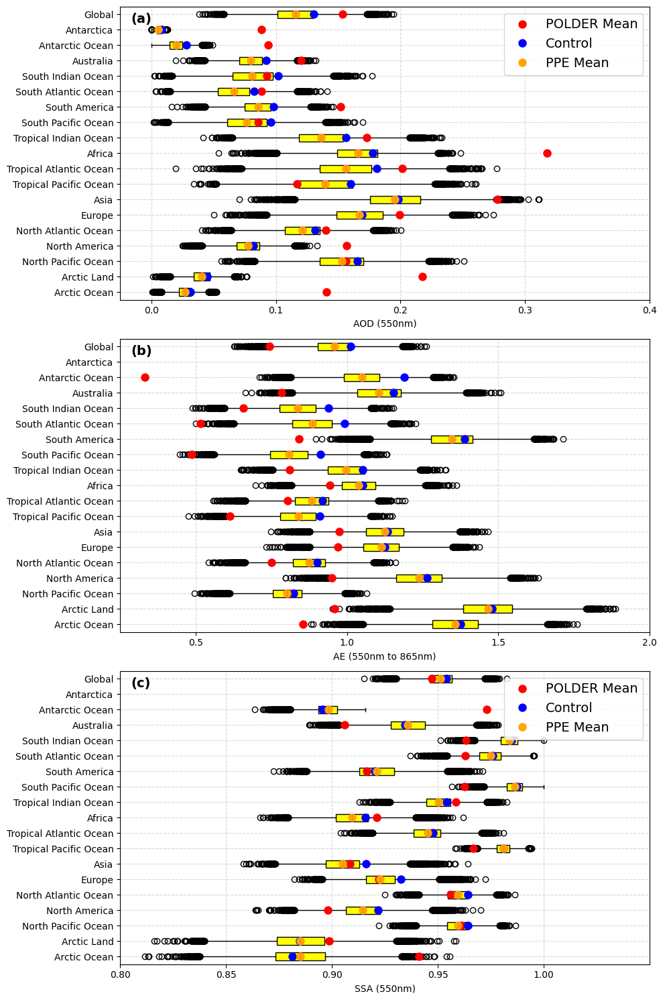

In [22]:
fig, axes = plt.subplots(3, 1, figsize=(10, 15), sharex=False)

metrics = [
    (boxplot_data_aod, polder_means_aod,boxplot_data_aod_control, "AOD (550nm)", (-0.025, 0.4), np.linspace(0, 0.4, 5)),
    (boxplot_data_ang, polder_means_ang,boxplot_data_ang_control, "AE (550nm to 865nm)", (0.25, 2), np.linspace(0.5, 2, 4)),
    (boxplot_data_ssa, polder_means_ssa,boxplot_data_ssa_control, "SSA (550nm)", (0.8, 1.05), np.linspace(0.8, 1.0, 5))

]

subplot_labels = ["(a)", "(b)", "(c)"]

for ax, (box_data, polder_means, control_means, xlabel, xlim, xticks), label in zip(axes, metrics, subplot_labels):
    boxprops = ax.boxplot(box_data, vert=False, labels=list(regions_cat.keys()), patch_artist=True, 
                          boxprops=dict(facecolor='yellow'))

    for i, mean in enumerate(polder_means):
        ax.plot(mean, i + 1, 'ro', markersize=8, label="POLDER Mean" if i == 0 else "")
    for i, mean in enumerate(control_means):
        ax.plot(mean, i + 1, 'ro',color='blue', markersize=8, label="Control" if i == 0 else "")
    for i, mean in enumerate(box_data):
        ax.plot(np.median(mean), i + 1, 'ro',color='orange', markersize=8, label="PPE Mean" if i == 0 else "")

    ax.set_xlabel(xlabel)#,fontweight=')
    ax.grid(True, linestyle="--", alpha=0.5)
    

    # Add subplot label at the top-left
    ax.text(0.02, 0.98, label, transform=ax.transAxes, fontsize=14, fontweight='bold', 
            va='top', ha='left')

    # Set x-axis limits and ticks
    ax.set_xlim(xlim)
    ax.set_xticks(xticks)
axes[0].legend(loc='upper right',fontsize=14)
axes[2].legend(loc='upper right',fontsize=14)

plt.tight_layout()
# plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PPE_Observation_BOX_AOD_SSA_ANG_2010.png", dpi=100, bbox_inches='tight')
# plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PPE_Observation_BOX_AOD_SSA_ANG_2010.pdf", dpi=100, bbox_inches='tight')


In [57]:
# # Define regions and their corresponding numerical indices
# regions_nn=xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/reg_18_regridded_nn.nc').reg

# regions_cat = {
#     "Arctic Ocean": 1, "Arctic Land": 2, "North Pacific Ocean": 3, "North America": 4,
#     "North Atlantic Ocean": 5, "Europe": 6, "Asia": 7, "Tropical Pacific Ocean": 8,
#     "Tropical Atlantic Ocean": 9, "Africa": 10, "Tropical Indian Ocean": 11,
#     "South Pacific Ocean": 12, "South America": 13, "South Atlantic Ocean": 14,
#     "South Indian Ocean": 15, "Australia": 16, "Antarctic Ocean": 17, "Antarctica": 18
# ,    "Global": 19}

# # Prepare data storage
# region_names = []
# boxplot_data = []
# polder_means = []

# gp_prediction_aod = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/AOD_Comparison_POLDER_10000_2009.nc')['Emulated TAU_2D_550nm']
# AOD_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2009/AOD_PPE_Pre_Emulator.nc').mean('time').load().TAU_2D_550nm
# POLDER_AOD = AOD_PPE[-1]
# aod_nanned = gp_prediction_aod.where(~np.isnan(POLDER_AOD))
# AOD_var = aod_nanned.std('sample') / aod_nanned.mean('sample') * 100

# gp_prediction_erf_mean = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/ERF_mean_3_million.nc')['Emulated emulator'].load()
# gp_prediction_erf_uncertainty = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/ERF_uncertainty_3_million.nc')['Emulated emulator'].load()
# ERF_var = gp_prediction_erf_uncertainty / gp_prediction_erf_mean * 100


# # Prepare data storage
# region_names = []
# data_erf = []
# data_aod = []

# # Loop through each region to compute statistics
# for region_name, r in regions_cat.items():
#     # Get model predictions
#     region_gp = Interpolate_Regional_uncertainty(AOD_var, r, regions_nn)
#     gpmeans = areaweight(region_gp, region_gp.lat)
#     data_aod.append(gpmeans.data)

#     region_gp_erf = Interpolate_Regional_uncertainty(ERF_var, r, regions_nn)
#     gpmeans_erf = areaweight(region_gp_erf, region_gp_erf.lat)
#     data_erf.append(gpmeans_erf.data)

#     if r == 18:
#         break

# gpmeans = areaweight(AOD_var, AOD_var.lat)
# gpmeans_erf = areaweight(ERF_var, ERF_var.lat)

# data_aod.append(gpmeans.data)
# data_erf.append(gpmeans_erf.data)

# for i in range(len(data_aod)):
#     print(list(regions_cat.keys())[i])
#     print('AOD =')
#     print(data_aod[i])
#     print('ERF =')
#     print(data_erf[i])

#     print('------------------')
# # print(f"Oceans = {(20.500213051964828+20.654161593069617+24.432769523311904+21.295919665132843+22.023629689647485+33.256053596735256+32.668356524484565+33.05876959004918) / 8}")
# # print(f"Land = {(21.306737156217913+17.974190543390282+18.312498593026273+18.145368985266842+20.876603681493272+21.426128918121442 / 6}")

# Figure 5

In [59]:
# ### This will merge the tables and give a total regional uncertainty csv to save.
table_erf = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_ERF_100000.csv')
#table_aod = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Table_of_Regional_Uncertainty_AOD_100000.csv')
table_aci = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_ERF_ACI_100000.csv')
table_ari = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_ERF_ARI_100000.csv')


#table = pd.merge(table_erf, table_aod, on=["Region", "Variable"], how="left", suffixes=("_erf", "_aod"))
table = pd.merge(table_erf, table_aci, on=["Region", "Variable"], how="left", suffixes=("_erf", "_aci"))
table = pd.merge(table, table_ari, on=["Region", "Variable"], how="left", suffixes=("", "_ari"))
table["Variable"] = table["Variable"].str.replace("V_SCALE_", "", regex=False)

table_erf = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Global_Uncertainty_250000_ERF.csv')
table_aci = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Global_Uncertainty_250000_ERF_ACI.csv')
table_ari = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Global_Uncertainty_250000_ERF_ARI.csv')
#table_aod = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Table_of_Global_Uncertainty_200000_AOD.csv')
#merged_table = pd.merge(table_erf, table_aod, on=["Variable"], how="left", suffixes=("_erf", "_aod"))
merged_table = pd.merge(table_erf, table_aci, on=["Variable"], how="left", suffixes=("_erf", "_aci"))
merged_table = pd.merge(merged_table, table_ari, on=["Variable"], how="left", suffixes=("", "_ari"))
merged_table["Variable"] = merged_table["Variable"].str.replace("V_SCALE_", "", regex=False)
merged_table.insert(0, 'Region', 'Global')

table_columns = set(table.columns)
merged_table_columns = set(merged_table.columns)
common_columns = table_columns.intersection(merged_table_columns)

# Convert the set of common columns to a list
common_columns_list = list(common_columns)

# Now use the list to filter the DataFrames
table_common = table[common_columns_list]
merged_table_common = merged_table[common_columns_list]


table = pd.concat([merged_table_common, table_common], ignore_index=True)


table.to_csv("/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_Variance_Total_ERF.csv")


In [3]:
# ### This will merge the tables and give a total regional uncertainty csv to save.
table_erf = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_AOD_PD_100000.csv')
#table_aod = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Table_of_Regional_Uncertainty_AOD_100000.csv')
table_aci = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_SSA_PD_100000.csv')
table_ari = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_ANG_PD_100000.csv')


#table = pd.merge(table_erf, table_aod, on=["Region", "Variable"], how="left", suffixes=("_erf", "_aod"))
table = pd.merge(table_erf, table_aci, on=["Region", "Variable"], how="left", suffixes=("_aod", "_ssa"))
table = pd.merge(table, table_ari, on=["Region", "Variable"], how="left", suffixes=("", "_ang"))
table["Variable"] = table["Variable"].str.replace("V_SCALE_", "", regex=False)

table_erf = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Global_Uncertainty_250000_AOD_PD.csv')
table_aci = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Global_Uncertainty_250000_SSA_PD.csv')
table_ari = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Global_Uncertainty_250000_ANG_PD.csv')
#table_aod = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Table_of_Global_Uncertainty_200000_AOD.csv')
#merged_table = pd.merge(table_erf, table_aod, on=["Variable"], how="left", suffixes=("_erf", "_aod"))
merged_table = pd.merge(table_erf, table_aci, on=["Variable"], how="left", suffixes=("_aod", "_ssa"))
merged_table = pd.merge(merged_table, table_ari, on=["Variable"], how="left", suffixes=("", "_ang"))
merged_table["Variable"] = merged_table["Variable"].str.replace("V_SCALE_", "", regex=False)
merged_table.insert(0, 'Region', 'Global')

table_columns = set(table.columns)
merged_table_columns = set(merged_table.columns)
common_columns = table_columns.intersection(merged_table_columns)
# Convert the set of common columns to a list
common_columns_list = list(common_columns)

# Now use the list to filter the DataFrames
table_common = table[common_columns_list]
merged_table_common = merged_table[common_columns_list]


table = pd.concat([merged_table_common, table_common], ignore_index=True)


#table.to_csv("/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_Variance_Total_AOD.csv")


In [2]:
table = pd.read_csv("/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_Variance_Total_ERF.csv")
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
table["Variable"] = table["Variable"].replace("EMI_SSA", "EMI_SS")


/scratch-local/ybhatti.12268838/ipykernel_1906729/702453113.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_5_erf = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF")).reset_index(drop=True)
/scratch-local/ybhatti.12268838/ipykernel_1906729/702453113.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_5_aci = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncert

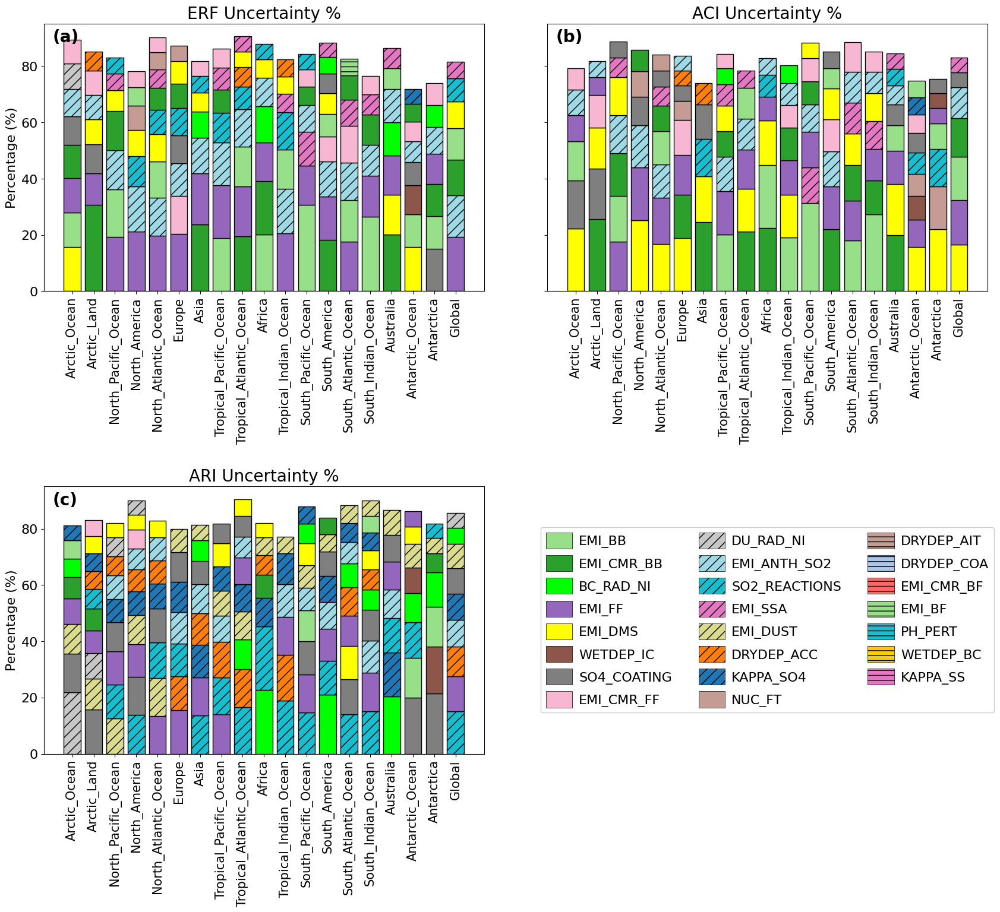

In [18]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import matplotlib.patches as mpatches

# # Define the region order
# region_order = ["NA", "Arctic_Ocean", "Arctic_Land", "North_Pacific_Ocean", "North_America", 
#                 "North_Atlantic_Ocean", "Europe", "Asia", "Tropical_Pacific_Ocean", 
#                 "Tropical_Atlantic_Ocean", "Africa", "Tropical_Indian_Ocean", 
#                 "South_Pacific_Ocean", "South_America", "South_Atlantic_Ocean", 
#                 "South_Indian_Ocean", "Australia", "Antarctic_Ocean", "Antarctica", "Global"]

# # Select the top 5 variables for each region for all metrics
# top_5_erf = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF")).reset_index(drop=True)
# top_5_aci = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF_ACI")).reset_index(drop=True)
# top_5_ari = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF_ARI")).reset_index(drop=True)

# # Filter out variables with uncertainty greater than 5%
# top_5_erf = top_5_erf[top_5_erf["Uncertainty_ERF"] > 5]
# top_5_aci = top_5_aci[top_5_aci["Uncertainty_ERF_ACI"] > 5]
# top_5_ari = top_5_ari[top_5_ari["Uncertainty_ERF_ARI"] > 5]

# # Apply the custom order to each dataset
# for df in [top_5_erf, top_5_aci, top_5_ari]:
#     df["Region"] = pd.Categorical(df["Region"], categories=region_order, ordered=True)
#     df.sort_values(by="Region", inplace=True)

# # Define variable order and colors
# # ordered_variables = [
# #     "CDNC_MIN", "EMI_BB", "EMI_CMR_BB", "BC_RAD_NI", "EMI_FF", "EMI_DMS", "WETDEP_IC", "SO4_COATING", "EMI_CMR_FF", 
# #     "DU_RAD_NI", "EMI_ANTH_SO2", "SO2_REACTIONS", "EMI_SSA", "EMI_DUST", "DRYDEP_ACC", "KAPPA_SO4", "NUC_FT", 
# #     "DRYDEP_AIT", "DRYDEP_COA", "EMI_CMR_BF", "EMI_BF", "PH_PERT", "WETDEP_BC", "KAPPA_SS"
# # ]

# # ordered_colors = [
# #     "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", 
# #     "#bcbd22", "#8c564b", "#7f7f7f", "#f7b6d2", "#c7c7c7",
# #     "#9edae5", "#17becf", "#e377c2", "#dbdb8d", "#ffbb78",
# #     "#98df8a", "#c49c94", "#c49c94", "#aec7e8", "#ff6666",
# #     "#98df8a", "#17becf", "#ffcc00", "#e377c2", "gray"
# # ]
# ordered_variables = [
#     "EMI_BB", "EMI_CMR_BB", "BC_RAD_NI", "EMI_FF", "EMI_DMS", "WETDEP_IC", "SO4_COATING", "EMI_CMR_FF", 
#     "DU_RAD_NI", "EMI_ANTH_SO2", "SO2_REACTIONS", "EMI_SS", "EMI_DUST", "DRYDEP_ACC", "KAPPA_SO4", "NUC_FT", 
#     "DRYDEP_AIT", "DRYDEP_COA", "EMI_CMR_BF", "EMI_BF", "PH_PERT", "WETDEP_BC", "KAPPA_SS"
# ]

# ordered_colors = [
#     "#98df8a", "#2ca02c", "lime", "#9467bd", 
#     "yellow", "#8c564b", "#7f7f7f", "#f7b6d2", "#c7c7c7",
#     "#9edae5", "#17becf", "#e377c2", "#dbdb8d", "#ff7f0e",
#     "#1f77b4", "#c49c94", "#c49c94", "#aec7e8", "#ff6666",
#     "#98df8a", "#17becf", "#ffcc00", "#e377c2", "gray"
# ]


# # Combine variables used in all selections for a consistent legend
# unique_variables = pd.concat([
#     top_5_erf["Variable"], 
#     top_5_aci["Variable"], 
#     top_5_ari["Variable"]
# ]).unique()

# # Sort variables within each region for stacking order
# top_5_erf = top_5_erf.sort_values(by=["Region", "Uncertainty_ERF"], ascending=[True, False])
# top_5_aci = top_5_aci.sort_values(by=["Region", "Uncertainty_ERF_ACI"], ascending=[True, False])
# top_5_ari = top_5_ari.sort_values(by=["Region", "Uncertainty_ERF_ARI"], ascending=[True, False])

# subplot_labels = ["(a)", "(b)", "(c)"]

# color_map = {var: color for var, color in zip(ordered_variables, ordered_colors)}

# # Create figure with 2x2 subplots but leave the bottom-right one empty
# fig, axes = plt.subplots(2, 2, figsize=(18, 16), sharey=True)

# # Remove the bottom-right plot (axes[1, 1])
# fig.delaxes(axes[1, 1])

# # Define plot data
# plots = [
#     (top_5_erf, "Uncertainty_ERF", "ERF Uncertainty %"),
#     (top_5_aci, "Uncertainty_ERF_ACI", "ACI Uncertainty %"),
#     (top_5_ari, "Uncertainty_ERF_ARI", "ARI Uncertainty %"),
# ]


# hatch_map = {
#     "DRYDEP_AIT": '--',
#     "DRYDEP_COA": '--',
#     "EMI_CMR_BF": '--',
#     "EMI_BF": '--',
#     "PH_PERT": '--',
#     "WETDEP_BC": '--',
#     "KAPPA_SS": '--',
#     "DU_RAD_NI": '//',
#     "EMI_ANTH_SO2": '//',
#     "SO2_REACTIONS": '//',
#     "EMI_SSA": '//',
#     "EMI_DUST": '//',
#     "DRYDEP_ACC": '//',
#     "KAPPA_SO4": '//'
# }
# # Plot each subplot
# # Update the plotting loop to use consistent hatching
# for ax, (data, metric, title), label in zip(axes.flat[:-1], plots, subplot_labels):
#     for region in data["Region"].unique():
#         region_data = data[data["Region"] == region]
#         bottom = None
#         for _, row in region_data.iterrows():
#             hatch = hatch_map.get(row["Variable"], '')  # Get hatch pattern from map
            
#             ax.bar(
#                 region,
#                 row[metric],
#                 bottom=bottom,
#                 color=color_map[row["Variable"]],
#                 hatch=hatch,
#                 edgecolor='black',
#                 #linewidth=0.5,  # Thinner edge lines
#                 label=row["Variable"] if row["Variable"] not in ax.get_legend_handles_labels()[1] else ""
#             )
#             bottom = bottom + row[metric] if bottom is not None else row[metric]
#     ax.set_xticklabels(data["Region"].unique(), rotation=90, fontsize=15)  # Rotate x labels
#     ax.set_title(title, fontsize=20)
#     # Add subplot label at the top-left
#     ax.text(0.02, 0.98, label, transform=ax.transAxes, fontsize=20, fontweight='bold', 
#             va='top', ha='left')
#     # Set y-axis ticks fontsize
# axes[0][0].tick_params(axis='y', labelsize=16)
# axes[1][0].tick_params(axis='y', labelsize=16)

# # Set y-axis label
# axes[0][0].set_ylabel("Percentage (%)", fontsize=16)
# axes[1][0].set_ylabel("Percentage (%)", fontsize=16)

# # # Create legend
# # handles = []
# # labels = []

# # for var in ordered_variables:
# #     # Define tighter hatch pattern
# #     hatch = '//' if var in ["DRYDEP_AIT", "DRYDEP_COA", "EMI_CMR_BF", "EMI_BF", 
# #                                "PH_PERT", "WETDEP_BC", "KAPPA_SS", "VERTICAL_VELOCITY"] else ''

# #     # Create a patch with edgecolor and hatching
# #     patch = mpatches.Rectangle((0, 0), 1, 1, facecolor=color_map[var], hatch=hatch, edgecolor='black', linewidth=1.5)
    
# #     handles.append(patch)
# #     labels.append(var)

# # # Adjust legend spacing and add it to the bottom-right (empty space)
# # fig.legend(handles, labels, title="", bbox_to_anchor=(1, 0), loc='lower right', fontsize=20, handleheight=1.5)

# # # Adjust layout and display the plot
# # plt.tight_layout(rect=[0, 0, 0.85, 1])  # Keep space for the legend

# # Create legend in the bottom-right plot (axes[1, 1] which we'll recreate)
# axes[1, 1] = fig.add_subplot(2, 2, 4)  # Recreate the bottom-right subplot

# # Turn off axes for the legend plot
# axes[1, 1].axis('off')

# # Update legend creation to match the hatching
# handles = []
# for var in ordered_variables:
#     hatch = hatch_map.get(var, '')
#     patch = mpatches.Rectangle(
#         (0, 0), 1, 1, 
#         facecolor=color_map[var], 
#         hatch=hatch,
#         edgecolor='black',
#         linewidth=0.5
#     )
#     handles.append(patch)

# # Adjust legend parameters
# axes[1, 1].legend(
#     handles, 
#     ordered_variables, 
#     loc='center', 
#     fontsize=16,  # Slightly smaller font for better fit
#     handleheight=1.5, 
#     framealpha=1, 
#     ncol=3,
#     handlelength=2,  # Longer handles for better hatch visibility
#     handletextpad=0.5  # Less space between handle and text
# )

# # Adjust layout with more padding
# plt.tight_layout(pad=3.0)



# # Uncomment to save the figure
# plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/Regional_Uncertainty_Map_ERF.png", dpi=300, bbox_inches='tight')
# plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/Regional_Uncertainty_Map_ERF.pdf", dpi=300, bbox_inches='tight')


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Define the region order
region_order = ["NA", "Arctic_Ocean", "Arctic_Land", "North_Pacific_Ocean", "North_America", 
                "North_Atlantic_Ocean", "Europe", "Asia", "Tropical_Pacific_Ocean", 
                "Tropical_Atlantic_Ocean", "Africa", "Tropical_Indian_Ocean", 
                "South_Pacific_Ocean", "South_America", "South_Atlantic_Ocean", 
                "South_Indian_Ocean", "Australia", "Antarctic_Ocean", "Antarctica", "Global"]

# Select the top 5 variables for each region for all metrics
top_5_erf = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF")).reset_index(drop=True)
top_5_aci = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF_ACI")).reset_index(drop=True)
top_5_ari = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF_ARI")).reset_index(drop=True)

# Filter out variables with uncertainty greater than 5%
top_5_erf = top_5_erf[top_5_erf["Uncertainty_ERF"] > 5]
top_5_aci = top_5_aci[top_5_aci["Uncertainty_ERF_ACI"] > 5]
top_5_ari = top_5_ari[top_5_ari["Uncertainty_ERF_ARI"] > 5]

# Apply the custom order to each dataset
for df in [top_5_erf, top_5_aci, top_5_ari]:
    df["Region"] = pd.Categorical(df["Region"], categories=region_order, ordered=True)
    df.sort_values(by="Region", inplace=True)

# Define variable order and colors
# ordered_variables = [
#     "CDNC_MIN", "EMI_BB", "EMI_CMR_BB", "BC_RAD_NI", "EMI_FF", "EMI_DMS", "WETDEP_IC", "SO4_COATING", "EMI_CMR_FF", 
#     "DU_RAD_NI", "EMI_ANTH_SO2", "SO2_REACTIONS", "EMI_SSA", "EMI_DUST", "DRYDEP_ACC", "KAPPA_SO4", "NUC_FT", 
#     "DRYDEP_AIT", "DRYDEP_COA", "EMI_CMR_BF", "EMI_BF", "PH_PERT", "WETDEP_BC", "KAPPA_SS"
# ]

# ordered_colors = [
#     "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", 
#     "#bcbd22", "#8c564b", "#7f7f7f", "#f7b6d2", "#c7c7c7",
#     "#9edae5", "#17becf", "#e377c2", "#dbdb8d", "#ffbb78",
#     "#98df8a", "#c49c94", "#c49c94", "#aec7e8", "#ff6666",
#     "#98df8a", "#17becf", "#ffcc00", "#e377c2", "gray"
# ]
ordered_variables = [
    "EMI_BB", "EMI_CMR_BB", "BC_RAD_NI", "EMI_FF", "EMI_DMS", "WETDEP_IC", "SO4_COATING", "EMI_CMR_FF", 
    "DU_RAD_NI", "EMI_ANTH_SO2", "SO2_REACTIONS", "EMI_SS", "EMI_DUST", "DRYDEP_ACC", "KAPPA_SO4", "NUC_FT", 
    "DRYDEP_AIT", "DRYDEP_COA", "EMI_CMR_BF", "EMI_BF", "PH_PERT", "WETDEP_BC", "KAPPA_SS"
]

ordered_colors = [
    "#98df8a", "#2ca02c", "lime", "#9467bd", 
    "yellow", "#8c564b", "#7f7f7f", "#f7b6d2", "#c7c7c7",
    "#9edae5", "#17becf", "#e377c2", "#dbdb8d", "#ff7f0e",
    "#1f77b4", "#c49c94", "#c49c94", "#aec7e8", "#ff6666",
    "gray", "#17becf", "#ffcc00", "#e377c2", "gray"
]


# Combine variables used in all selections for a consistent legend
unique_variables = pd.concat([
    top_5_erf["Variable"], 
    top_5_aci["Variable"], 
    top_5_ari["Variable"]
]).unique()

# Sort variables within each region for stacking order
top_5_erf = top_5_erf.sort_values(by=["Region", "Uncertainty_ERF"], ascending=[True, False])
top_5_aci = top_5_aci.sort_values(by=["Region", "Uncertainty_ERF_ACI"], ascending=[True, False])
top_5_ari = top_5_ari.sort_values(by=["Region", "Uncertainty_ERF_ARI"], ascending=[True, False])

subplot_labels = ["(a)", "(b)", "(c)"]

color_map = {var: color for var, color in zip(ordered_variables, ordered_colors)}

# Create figure with 2x2 subplots but leave the bottom-right one empty
fig, axes = plt.subplots(2, 2, figsize=(18, 16), sharey=True)

# Remove the bottom-right plot (axes[1, 1])
fig.delaxes(axes[1, 1])

# Define plot data
plots = [
    (top_5_erf, "Uncertainty_ERF", "ERF Uncertainty %"),
    (top_5_aci, "Uncertainty_ERF_ACI", "ACI Uncertainty %"),
    (top_5_ari, "Uncertainty_ERF_ARI", "ARI Uncertainty %"),
]


hatch_map = {
    # Microphysics (dashed)
    "KAPPA_SS": '//',
    "KAPPA_SO4": '//',
    "NUC_FT": '//',
    "PH_PERT": '//',
    "BC_RAD_NI": '//',
    "DU_RAD_NI": '//',

    # Chemistry (crosshatch)
    "SO2_REACTIONS": 'xx',
    "WETDEP_IC": 'xx',
    "WETDEP_BC": 'xx',
    "DRYDEP_ACC": 'xx',
    "DRYDEP_AIT": 'xx',
    "DRYDEP_COA": 'xx',
    "SO4_COATING": 'xx',

    # Emissions (none or simple slashes)
    # "EMI_BB": '//',
    "EMI_CMR_BB": '--',
    # "EMI_FF": '//',
    # "EMI_DMS": '//',
    "EMI_CMR_FF": '--',
    # "EMI_ANTH_SO2": '//',
    # "EMI_SSA": '//',
    # "EMI_DUST": '//',
    "EMI_CMR_BF": '--'
    # "EMI_BF": '//',
}
# Plot each subplot
# Update the plotting loop to use consistent hatching
for ax, (data, metric, title), label in zip(axes.flat[:-1], plots, subplot_labels):
    for region in data["Region"].unique():
        region_data = data[data["Region"] == region]
        region_data["Variable"] = pd.Categorical(region_data["Variable"], categories=ordered_variables[::-1], ordered=True)
        region_data.sort_values("Variable", inplace=True)  # Ensure correct bottom-to-top order

        bottom = 0
        for _, row in region_data.iterrows():
            var = row["Variable"]
            hatch = hatch_map.get(var, '')
            ax.bar(
                region,
                row[metric],
                bottom=bottom,
                color=color_map[var],
                hatch=hatch,
                edgecolor='black',
                label=var if var not in ax.get_legend_handles_labels()[1] else ""
            )
            bottom += row[metric]
    ax.set_xticklabels(data["Region"].unique(), rotation=90, fontsize=15)  # Rotate x labels
    ax.set_title(title, fontsize=20)
    # Add subplot label at the top-left
    ax.text(0.02, 0.98, label, transform=ax.transAxes, fontsize=20, fontweight='bold', 
            va='top', ha='left')
    # Set y-axis ticks fontsize
axes[0][0].tick_params(axis='y', labelsize=16)
axes[1][0].tick_params(axis='y', labelsize=16)

# Set y-axis label
axes[0][0].set_ylabel("Percentage (%)", fontsize=16)
axes[1][0].set_ylabel("Percentage (%)", fontsize=16)

# # Create legend
# handles = []
# labels = []

# for var in ordered_variables:
#     # Define tighter hatch pattern
#     hatch = '//' if var in ["DRYDEP_AIT", "DRYDEP_COA", "EMI_CMR_BF", "EMI_BF", 
#                                "PH_PERT", "WETDEP_BC", "KAPPA_SS", "VERTICAL_VELOCITY"] else ''

#     # Create a patch with edgecolor and hatching
#     patch = mpatches.Rectangle((0, 0), 1, 1, facecolor=color_map[var], hatch=hatch, edgecolor='black', linewidth=1.5)
    
#     handles.append(patch)
#     labels.append(var)

# # Adjust legend spacing and add it to the bottom-right (empty space)
# fig.legend(handles, labels, title="", bbox_to_anchor=(1, 0), loc='lower right', fontsize=20, handleheight=1.5)

# # Adjust layout and display the plot
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Keep space for the legend

# Create legend in the bottom-right plot (axes[1, 1] which we'll recreate)
axes[1, 1] = fig.add_subplot(2, 2, 4)  # Recreate the bottom-right subplot

# Turn off axes for the legend plot
axes[1, 1].axis('off')

# Update legend creation to match the hatching
handles = []
for var in ordered_variables:
    hatch = hatch_map.get(var, '')
    patch = mpatches.Rectangle(
        (0, 0), 1, 1, 
        facecolor=color_map[var], 
        hatch=hatch,
        edgecolor='black',
        linewidth=0.5
    )
    handles.append(patch)

# Adjust legend parameters
axes[1, 1].legend(
    handles, 
    ordered_variables, 
    loc='center', 
    fontsize=16,  # Slightly smaller font for better fit
    handleheight=1.5, 
    framealpha=1, 
    ncol=3,
    handlelength=2,  # Longer handles for better hatch visibility
    handletextpad=0.5  # Less space between handle and text
)

# Adjust layout with more padding
plt.tight_layout(pad=3.0)



# Uncomment to save the figure
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/Regional_Uncertainty_Map_ERF.png", dpi=300, bbox_inches='tight')
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/Regional_Uncertainty_Map_ERF.pdf", dpi=300, bbox_inches='tight')

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


In [9]:
table = pd.read_csv("/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Regional_Uncertainty_Variance_Total_AOD.csv")
table["Variable"] = table["Variable"].replace("EMI_SSA", "EMI_SS")


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
#table = pd.read_csv("/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/Table_of_Regional_Uncertainty_Variance_Total_AOD.csv")

# Define the region order
region_order = ["NA", "Arctic_Ocean", "Arctic_Land", "North_Pacific_Ocean", "North_America", 
                "North_Atlantic_Ocean", "Europe", "Asia", "Tropical_Pacific_Ocean", 
                "Tropical_Atlantic_Ocean", "Africa", "Tropical_Indian_Ocean", 
                "South_Pacific_Ocean", "South_America", "South_Atlantic_Ocean", 
                "South_Indian_Ocean", "Australia", "Antarctic_Ocean", "Antarctica", "Global"]

# Select the top 5 variables for each region for all metrics
top_5_erf = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_AOD_PD")).reset_index(drop=True)
top_5_aci = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ANG_PD")).reset_index(drop=True)
top_5_ari = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_SSA_PD")).reset_index(drop=True)

# Filter out variables with uncertainty greater than 5%
top_5_erf = top_5_erf[top_5_erf["Uncertainty_AOD_PD"] > 5]
top_5_aci = top_5_aci[top_5_aci["Uncertainty_ANG_PD"] > 5]
top_5_ari = top_5_ari[top_5_ari["Uncertainty_SSA_PD"] > 5]

# Apply the custom order to each dataset
for df in [top_5_erf, top_5_aci, top_5_ari]:
    df["Region"] = pd.Categorical(df["Region"], categories=region_order, ordered=True)
    df.sort_values(by="Region", inplace=True)

# Define variable order and colors
ordered_variables = [
    "EMI_BB", "EMI_CMR_BB", "BC_RAD_NI", "EMI_FF", "EMI_DMS", "WETDEP_IC", "SO4_COATING", "EMI_CMR_FF", 
    "DU_RAD_NI", "EMI_ANTH_SO2", "SO2_REACTIONS", "EMI_SS", "EMI_DUST", "DRYDEP_ACC", "KAPPA_SO4", "NUC_FT", 
    "DRYDEP_AIT", "DRYDEP_COA", "EMI_CMR_BF", "EMI_BF", "PH_PERT", "WETDEP_BC", "KAPPA_SS"
]

ordered_colors = [
    "#98df8a", "#2ca02c", "lime", "#9467bd", 
    "yellow", "#8c564b", "#7f7f7f", "#f7b6d2", "#c7c7c7",
    "#9edae5", "#17becf", "#e377c2", "#dbdb8d", "#ff7f0e",
    "#1f77b4", "#c49c94", "#c49c94", "#aec7e8", "#ff6666",
    "#98df8a", "#17becf", "#ffcc00", "#e377c2"
]
# Combine variables used in all selections for a consistent legend
unique_variables = pd.concat([
    top_5_erf["Variable"], 
    top_5_aci["Variable"], 
    top_5_ari["Variable"]
]).unique()

# Sort variables within each region for stacking order
top_5_erf = top_5_erf.sort_values(by=["Region", "Uncertainty_AOD_PD"], ascending=[True, False])
top_5_aci = top_5_aci.sort_values(by=["Region", "Uncertainty_ANG_PD"], ascending=[True, False])
top_5_ari = top_5_ari.sort_values(by=["Region", "Uncertainty_SSA_PD"], ascending=[True, False])

subplot_labels = ["(a)", "(b)", "(c)"]

color_map = {var: color for var, color in zip(ordered_variables, ordered_colors)}

# Create figure with 2x2 subplots but leave the bottom-right one empty
fig, axes = plt.subplots(2, 2, figsize=(18, 16), sharey=True)

# Remove the bottom-right plot (axes[1, 1])
fig.delaxes(axes[1, 1])

# Define plot data
plots = [
    (top_5_erf, "Uncertainty_AOD_PD", "AOD Uncertainty %"),
    (top_5_aci, "Uncertainty_ANG_PD", "AE Uncertainty %"),
    (top_5_ari, "Uncertainty_SSA_PD", "SSA Uncertainty %"),
]

hatch_map = {
    # Microphysics (dashed)
    "KAPPA_SS": '//',
    "KAPPA_SO4": '//',
    "NUC_FT": '//',
    "PH_PERT": '//',
    "BC_RAD_NI": '//',
    "DU_RAD_NI": '//',

    # Chemistry (crosshatch)
    "SO2_REACTIONS": 'xx',
    "WETDEP_IC": 'xx',
    "WETDEP_BC": 'xx',
    "DRYDEP_ACC": 'xx',
    "DRYDEP_AIT": 'xx',
    "DRYDEP_COA": 'xx',
    "SO4_COATING": 'xx',

    # Emissions (none or simple slashes)
    # "EMI_BB": '//',
    "EMI_CMR_BB": '--',
    # "EMI_FF": '//',
    # "EMI_DMS": '//',
    "EMI_CMR_FF": '--',
    # "EMI_ANTH_SO2": '//',
    # "EMI_SSA": '//',
    # "EMI_DUST": '//',
    "EMI_CMR_BF": '--'
    # "EMI_BF": '//',
}


# Plot each subplot
# Update the plotting loop to use consistent hatching
for ax, (data, metric, title), label in zip(axes.flat[:-1], plots, subplot_labels):
    for region in data["Region"].unique():
        region_data = data[data["Region"] == region]
        region_data["Variable"] = pd.Categorical(region_data["Variable"], categories=ordered_variables[::-1], ordered=True)
        region_data.sort_values("Variable", inplace=True)  # Ensure correct bottom-to-top order

        bottom = 0
        for _, row in region_data.iterrows():
            var = row["Variable"]
            hatch = hatch_map.get(var, '')
            ax.bar(
                region,
                row[metric],
                bottom=bottom,
                color=color_map[var],
                hatch=hatch,
                edgecolor='black',
                label=var if var not in ax.get_legend_handles_labels()[1] else ""
            )
            bottom += row[metric]
    ax.set_xticklabels(data["Region"].unique(), rotation=90, fontsize=15)  # Rotate x labels
    ax.set_title(title, fontsize=20)
    # Add subplot label at the top-left
    ax.text(0.02, 0.98, label, transform=ax.transAxes, fontsize=20, fontweight='bold', 
            va='top', ha='left')
    # Set y-axis ticks fontsize
axes[0][0].tick_params(axis='y', labelsize=16)
axes[1][0].tick_params(axis='y', labelsize=16)

# Set y-axis label
axes[0][0].set_ylabel("Percentage (%)", fontsize=16)
axes[1][0].set_ylabel("Percentage (%)", fontsize=16)

axes[1, 1] = fig.add_subplot(2, 2, 4)  # Recreate the bottom-right subplot

# Turn off axes for the legend plot
axes[1, 1].axis('off')

# Update legend creation to match the hatching
handles = []
for var in ordered_variables:
    hatch = hatch_map.get(var, '')
    patch = mpatches.Rectangle(
        (0, 0), 1, 1, 
        facecolor=color_map[var], 
        hatch=hatch,
        edgecolor='black',
        linewidth=0.5
    )
    handles.append(patch)

# Adjust legend parameters
axes[1, 1].legend(
    handles, 
    ordered_variables, 
    loc='center', 
    fontsize=14,  # Slightly smaller font for better fit
    handleheight=1.5, 
    framealpha=1, 
    ncol=3,
    handlelength=2,  # Longer handles for better hatch visibility
    handletextpad=0.5  # Less space between handle and text
)

# Adjust layout with more padding
plt.tight_layout(pad=3.0)



# Uncomment to save the figure
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/Regional_Uncertainty_Map_AOD.png", dpi=300, bbox_inches='tight')
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/Regional_Uncertainty_Map_AOD.pdf", dpi=300, bbox_inches='tight')


# TABLE 1(?)

In [49]:
table_global_uncertainty = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Table_of_Global_Uncertainty_250000_ERF.csv')
sorted_results_gp = table_global_uncertainty.sort_values(by='std', ascending=False).reset_index(drop=True)

dec=5
sorted_results_gp = sorted_results_gp.assign(**{
    col: sorted_results_gp[col].apply(lambda x: f"{x:.{dec}f}") for col in [ 'std']
})
columns_to_drop = ['range_ERF', '5%_ERF', '95%_ERF','%range_ERF']
sorted_results_gp = sorted_results_gp.drop(columns=columns_to_drop )



In [50]:
sorted_results_gp

,Variable,std,Uncertainty_ERF
0,V_SCALE_EMI_FF,0.12526,1.924867e+01
1,V_SCALE_EMI_ANTH_SO2,0.09597,1.474739e+01
2,V_SCALE_EMI_CMR_BB,0.08236,1.265592e+01
3,V_SCALE_EMI_BB,0.07374,1.133079e+01
4,V_SCALE_EMI_DMS,0.06204,9.533682e+00
5,V_SCALE_SO2_REACTIONS,0.05294,8.134502e+00
6,V_SCALE_EMI_SSA,0.03894,5.983191e+00
7,V_SCALE_NUC_FT,0.02705,4.156895e+00
8,V_SCALE_EMI_CMR_FF,0.02410,3.703144e+00
9,V_SCALE_BC_RAD_NI,0.02311,3.551548e+00


## Supplimentary Matarials Regional Plot :


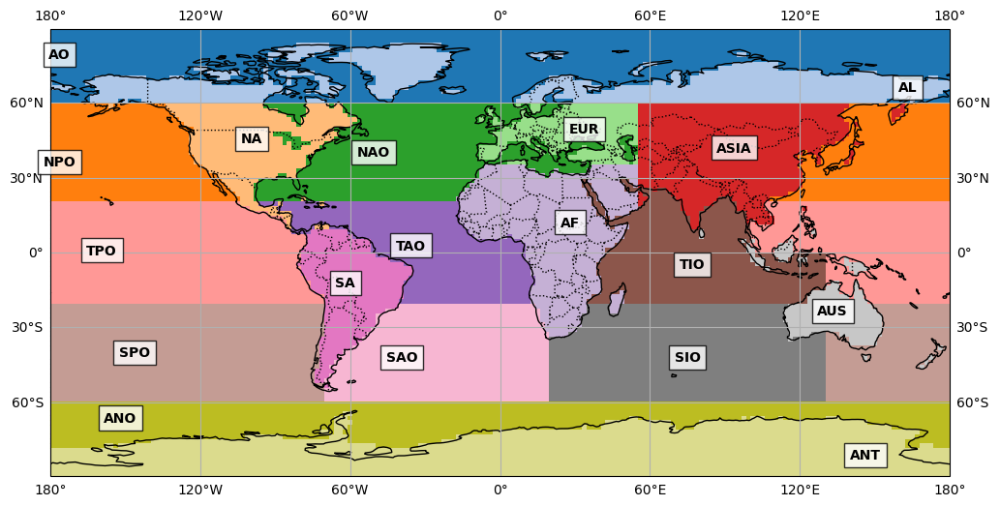

In [31]:
regions_nn=xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/reg_18_regridded_nn.nc').reg
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import random
from matplotlib.colors import ListedColormap
import seaborn as sns  # Provides Glasbey colormap

# Define region categories with acronyms
region_acronyms = {
    1: "AO", 2: "AL", 3: "NPO", 4: "NA", 5: "NAO", 6: "EUR", 7: "ASIA", 8: "TPO",
    9: "TAO", 10: "AF", 11: "TIO", 12: "SPO", 13: "SA", 14: "SAO", 15: "SIO",
    16: "AUS", 17: "ANO", 18: "ANT"
}

# Generate a maximally distinct color palette (Glasbey colormap)
num_regions = len(region_acronyms)
colors = sns.color_palette("tab20", num_regions)  # Uses a predefined categorical colormap
#random.shuffle(colors)  # Randomize colors for variation
random_cmap = ListedColormap(colors)

# Create figure with PlateCarree projection
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot using pcolormesh with discrete colors
mesh = ax.pcolormesh(regions_nn.lon, regions_nn.lat, regions_nn.data, cmap=random_cmap, shading="nearest")

# Add coastlines, borders, and gridlines
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=":")
ax.gridlines(draw_labels=True)

# Place labels at the **centroid** of each region
for region_id, acronym in region_acronyms.items():
    mask = regions_nn.data == region_id  # Boolean mask for region pixels
    if np.any(mask):  # Ensure the region exists in data
        lat_vals, lon_vals = np.meshgrid(regions_nn.lat.values, regions_nn.lon.values, indexing="ij")
        
        # Get all lat/lon points belonging to the region
        region_lats = lat_vals[mask]
        region_lons = lon_vals[mask]
        
        # Compute centroid as the median (more robust than mean)
        lat_center = np.median(region_lats)
        lon_center = np.median(region_lons)
        
        # Place label at centroid
        ax.text(lon_center, lat_center, acronym, transform=ccrs.PlateCarree(),
                ha="center", va="center", fontsize=10, fontweight="bold",
                bbox=dict(facecolor="white", alpha=0.8, edgecolor="black"))

# Add colorbar
#cbar = plt.colorbar(mesh, ax=ax, orientation="vertical", label="Regions")

#plt.title("Regional Map with Centered Acronyms & Distinct Colors")
#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Map_of_Regions.png", dpi=300, bbox_inches='tight')


## Supplimentary Matarials 1 :
### Table S1


In [45]:
SSA_Regional = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Table_of_Regional_SSA_mean.csv')
Cloud_Cover_Regional = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Table_of_Regional_Cloud_Cover_mean.csv')
ERFARI_Regional = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Table_of_Regional_ERF_ARI_mean.csv')
ERFACI_Regional = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Table_of_Regional_ERF_ACI_mean.csv')
ERF_Regional = pd.read_csv('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Table_of_Regional_ERF_mean.csv')


## Supplimentary Matarials F1 :


## Supplimentary Matarials F2 :

/scratch-local/ybhatti.9854182/ipykernel_1547776/3207764682.py:14: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  t = stats.ttest_ind(run10,run1,axis=axis1, nan_policy='omit'); tt=t[1]


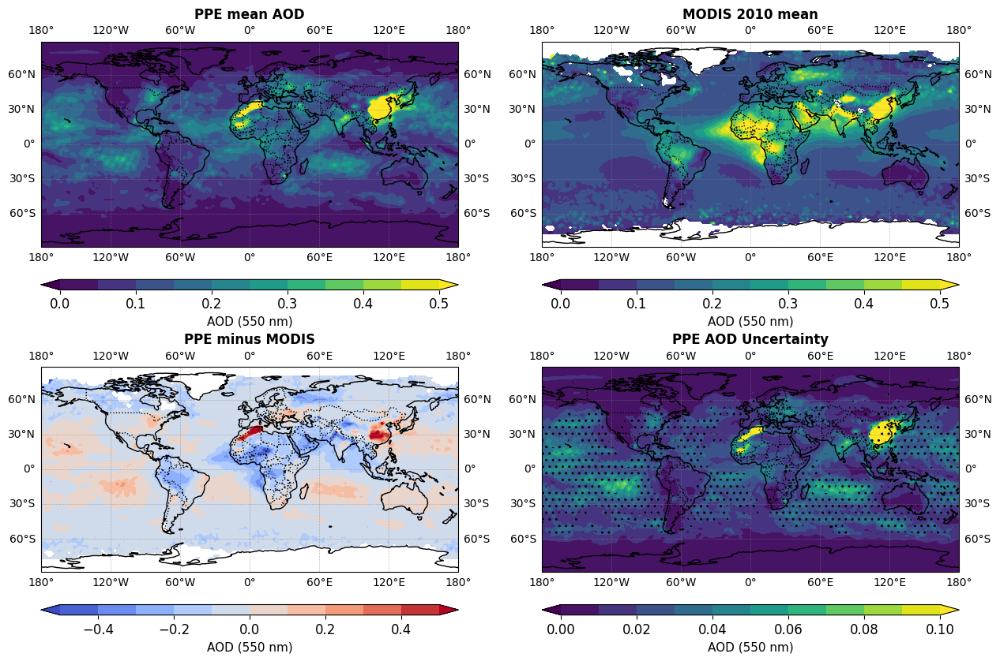

In [26]:
aod_modis = xr.open_mfdataset('/home/ybhatti/prjs1076/Observational_Data/2003-2014/regridded/g4.timeAvg.MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.2010*',combine='nested',concat_dim='month').MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.load().mean('month')
lats_modis = aod_modis.mean('lon')
from scipy import stats

AOD_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Total_AOD_3_million.nc')['Emulated TAU_2D_550nm'][:100000]
# n=100000
# para_norm,para = pdf_parameters(n,ppe_paramater)
# gp_prediction, _ = gp_model_.predict(para_norm.values)
# nn_prediction, _ = nn_model.predict(para_norm.values)
# ML=(gp_prediction+nn_prediction)/2
#lats_ML = AOD_PPE.mean('lon')

def find_diffs(run10,run1,axis1):
    t = stats.ttest_ind(run10,run1,axis=axis1, nan_policy='omit'); tt=t[1]
    diff = np.where(tt>0.05, 1, 0) #1 indicates it is not statistically significant; 0 indicates it is
    return diff
dots=find_diffs(AOD_PPE,aod_modis,0)
AOD_PPEs = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/AOD_mean_3_million.nc')['Emulated TAU_2D_550nm']
#AOD_PPE_uncertainty = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/AOD_uncertainty_3_million.nc')['Emulated TAU_2D_550nm']

fig, ax = plt.subplots(2, 2, figsize=(15, 13), subplot_kw={'projection': ccrs.PlateCarree()})
plt.subplots_adjust(hspace=-0.3)#x=np.arange(40,70,5)
clevs=np.arange(0,0.5+0.05,0.05)
clevs_std=np.arange(0,0.1+0.01,0.01)
xa,ya  = np.meshgrid(lons,lats)
gridline_options = {
    'draw_labels': True,
    'xlabel_style': {'size': 10},  # Custom x-axis label font size
    'ylabel_style': {'size':10}  # Custom y-axis label font size
}

clevs_diff=np.arange(-0.5,0.5+0.1,0.1)
diff = (AOD_PPEs.data-aod_modis.data)
cs1=plot_map(ax[0][0],AOD_PPEs,lons,lats,'viridis',clevs,gridline_kwargs=gridline_options)
cs2=plot_map(ax[0][1],aod_modis,lons,lats,'viridis',clevs,gridline_kwargs=gridline_options)
cs3=plot_map(ax[1][0],diff,lons,lats,'coolwarm',clevs_diff,gridline_kwargs=gridline_options)
cs4=plot_map(ax[1][1],AOD_PPE.std('sample'),lons,lats,'viridis',clevs_std,gridline_kwargs=gridline_options)


#map_ax1 = Basemap(projection='spstere',boundinglat=-25, lon_0=0,
#                    resolution ='c',ax=ax[1][0])
#x, y = map_ax1(xa,ya) 
#1 indicates it is not statistically significant; 0 indicates it is
[m,n] = np.where(dots==1)
z1 = np.zeros(dots.shape)
z1[m,n]=99
ax[1][1].contourf(lons, lats, z1, 1, hatches=['', '..'], alpha=0)

ax[0][0].set_title('(a) PPE mean AOD', fontweight='bold')
ax[0][1].set_title('(b) MODIS 2010 mean', fontweight='bold')
ax[1][0].set_title('(c) PPE minus MODIS', fontweight='bold')
ax[1][1].set_title('(d) PPE AOD Uncertainty', fontweight='bold')

cbar1 = plt.colorbar(cs1, ax=ax[0][0], orientation='horizontal', pad=0.07, aspect=40, shrink=1)
cbar1.ax.tick_params(labelsize=12)  # Adjust the tick size as needed

cbar2 = plt.colorbar(cs2, ax=ax[0][1], orientation='horizontal', pad=0.07, aspect=40, shrink=1)
cbar2.ax.tick_params(labelsize=12)  # Adjust the tick size as needed

cbar3 = plt.colorbar(cs3, ax=ax[1][0], orientation='horizontal', pad=0.07, aspect=40, shrink=1)
cbar3.ax.tick_params(labelsize=12)  # Adjust the tick size as needed

cbar4 = plt.colorbar(cs4, ax=ax[1][1], orientation='horizontal', pad=0.07, aspect=40, shrink=1)
cbar4.ax.tick_params(labelsize=12)  # Adjust the tick size as needed


#cbar1.ax.tick_params(labelsize=20)  # Adjust the tick size as needed
#cbar1.set_ticks(np.arange(-30,1+0,10)) # ERF STD # Manually set tick positions
#cbar1.set_ticks(np.arange(0.7,1+0,10)) # ERF STD # Manually set tick positions

cbar1.set_label(r'AOD (550 nm)',fontsize=11)
cbar2.set_label(r'AOD (550 nm)',fontsize=11)
cbar3.set_label(r'AOD (550 nm)',fontsize=11)
cbar4.set_label(r'AOD (550 nm)',fontsize=11)

plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/AOD_MODIS_Comparison_Supplimentary.png",dpi=300,bbox_inches = 'tight')


In [ ]:
AOD_PPE_area = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/AOD_areaweighted_3_million.nc')['__xarray_dataarray_variable__'][:].load()

aod_modis_clim = xr.open_mfdataset('/home/ybhatti/prjs1076/Observational_Data/2003-2014/regridded/g4.timeAvg.MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.2010*',combine='nested',concat_dim='month').MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.load().mean('month')
aod_modis_std = xr.open_mfdataset('/home/ybhatti/prjs1076/Observational_Data/2003-2014/regridded/g4.timeAvg.MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.2010*',combine='nested',concat_dim='month').MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.load().std('month')
aod_modis_area = areaweight(aod_modis_clim,aod_modis_clim.lat)
aod_modis_area_std = areaweight(aod_modis_std,aod_modis_clim.lat)


# Compute the upper and lower bounds for each month
lower_bound = aod_modis_area - aod_modis_area_std
upper_bound = aod_modis_area + aod_modis_area_std

# Find the values within the bounds
within_bounds = (AOD_PPE_area >= lower_bound) & (AOD_PPE_area <= upper_bound)

# Calculate the percentage of values within bounds for each month
percent_within_bounds = within_bounds.sum(dim="sample") / AOD_PPE_area.sizes["sample"] * 100

# Print the results
print(percent_within_bounds)


## Supplimentary Matarials F3 :


In [146]:
from datetime import datetime
custom_date_parser = lambda x: datetime.strptime(x, "%Y-%m-%d")
CapeGrim=pd.read_csv('/home/ybhatti/prjs1076/Observational_Data/CapeGrim_All_DMS_data1989-96.csv',parse_dates=['Datetime'],skiprows=1,usecols=[0,2])
CapeGrim=CapeGrim[1::]
CapeGrim['month']=CapeGrim['Datetime'].dt.month # add a new column for each month 
CapeGrim['season']=CapeGrim['Datetime'].dt.month # add a new column to change into seasons

CapeGrim['DMS']=pd.to_numeric(CapeGrim['DMS']) 
CapeGrim_CLIM=CapeGrim.groupby('month').mean() # Create climatology of A-DMS
CapeGrim_std=CapeGrim.groupby('month').std() # Create std of A-DMS
Cape_DMS=CapeGrim_CLIM['DMS'].to_numpy()
Cape_DMS_std=CapeGrim_std['DMS'].to_numpy()
mon=[12,1,2,3,4,5,6,7,8,9,10,11]
seas=[0,0,0,1,1,1,2,2,2,3,3,3]
#label the season the month is in. (0 = DJF; 1 = MAM; 2 = JJA; 3 = SON)
for m,se in zip(mon,seas):
    CapeGrim['season'].replace(to_replace=m,value=se,inplace=True) 

# ######################################################################### Station
# ######################### AMSTERDAM ISLAND ##############################  37°50′S 77°33′E
# ######################################################################### A-DMS
# netcdf is easier to clean
AMSTERDAM=xr.open_dataset('/home/ybhatti/prjs1076/Observational_Data/AmsterdamIsland/DMS_atmos_AmsterdamIsland_daily.nc')
AMSTERDAM_DMS=AMSTERDAM.surface_dimethyl_sulfide_concentrations
AMSTERDAM_lat=AMSTERDAM.latitude
AMSTERDAM_std=AMSTERDAM_DMS.groupby('time.month').std("time")[:,0]

AMSTERDAM_CLIM_DMS=AMSTERDAM_DMS.groupby('time.month').mean("time")[:,0]
Ams_Mons=[]
for i in range(1,13):
    mon = AMSTERDAM_DMS.where((AMSTERDAM_DMS['time.month'] == i), drop=True)
    Ams_Mons.append(mon.data) # for my violin plot - all the data in each month is flattened and appended/stored


Amsterdam_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/PPE_Amsterdam_DMS.nc')['Emulated DMS']
Cape_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/PPE_Cape_Grim_DMS.nc')['Emulated DMS']



#gpmeans = areaweight(region,region.lat)
DMS_CAPE_uncert = Cape_PPE.std('sample')#**2
DMS_CAPE_mean = Cape_PPE.mean('sample')
DMS_AMS_uncert = Amsterdam_PPE.std('sample')#**2
DMS_AMS_mean = Amsterdam_PPE.mean('sample')
            


/scratch-local/ybhatti.9842171/ipykernel_3765002/2747034853.py:3: UserWarning: Parsing dates in %d/%m/%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  CapeGrim=pd.read_csv('/home/ybhatti/prjs1076/Observational_Data/CapeGrim_All_DMS_data1989-96.csv',parse_dates=['Datetime'],skiprows=1,usecols=[0,2])
/scratch-local/ybhatti.9842171/ipykernel_3765002/2747034853.py:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  CapeGrim['season'].replace(to_repla

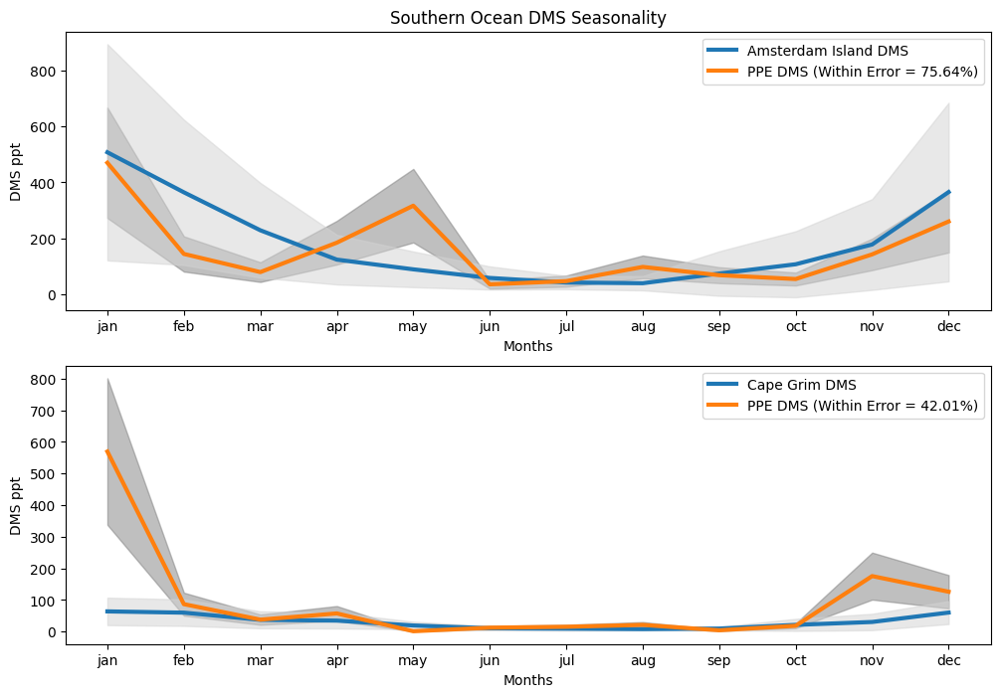

In [147]:
fig, ax = plt.subplots(2, 1, figsize=(12, 8))
# Compute the upper and lower bounds for each month
lower_bound = AMSTERDAM_CLIM_DMS - AMSTERDAM_std
upper_bound = AMSTERDAM_CLIM_DMS + AMSTERDAM_std
# Find the values within the bounds
within_bounds = (Amsterdam_PPE >= lower_bound) & (Amsterdam_PPE <= upper_bound)
# Calculate the percentage of values within bounds for each month
percent_within_bounds = within_bounds.sum(dim="sample") / Amsterdam_PPE.sizes["sample"] * 100
ams_percent = percent_within_bounds.mean()

# Print the results
r2 = np.corrcoef(DMS_AMS_mean,AMSTERDAM_CLIM_DMS)[0][1]**2
# Plotting the Amsterdam CLIM DMS and GP Mean
ax[0].plot(AMSTERDAM_CLIM_DMS, label="Amsterdam Island DMS",lw=3)
ax[0].plot(DMS_AMS_mean[:], label=f"PPE DMS (Within Error = {ams_percent:.2f}%)",lw=3)
# Shading the uncertainty range around GP Mean
ax[0].fill_between(
    range(DMS_CAPE_mean.shape[0]),  # Assuming time is on x-axis
    DMS_AMS_mean[:] - DMS_AMS_uncert,  # Lower bound of uncertainty
    DMS_AMS_mean[:] + DMS_AMS_uncert,  # Upper bound of uncertainty
    color="gray",
    alpha=0.5)
ax[0].fill_between(
    range(DMS_CAPE_mean.shape[0]),  # Assuming time is on x-axis
    AMSTERDAM_CLIM_DMS[:] - AMSTERDAM_std,  # Lower bound of uncertainty
    AMSTERDAM_CLIM_DMS[:] + AMSTERDAM_std,  # Upper bound of uncertainty
    color="lightgray",
    alpha=0.5)

months = ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']


# Plotting the Cape grim DMS and GP Mean
lower_bound = Cape_DMS - DMS_CAPE_uncert
upper_bound = Cape_DMS + DMS_CAPE_uncert
# Find the values within the bounds
within_bounds = (Cape_PPE >= lower_bound) & (Cape_PPE <= upper_bound)
# Calculate the percentage of values within bounds for each month
percent_within_bounds = within_bounds.sum(dim="sample") / Amsterdam_PPE.sizes["sample"] * 100
cape_percent = percent_within_bounds.mean()

r2 = np.corrcoef(DMS_CAPE_mean,Cape_DMS)[0][1]**2
ax[1].plot(Cape_DMS, label="Cape Grim DMS",lw=3)
ax[1].plot(DMS_CAPE_mean[:], label=f"PPE DMS (Within Error = {cape_percent:.2f}%)",lw=3)

# Shading the uncertainty range around GP Mean
ax[1].fill_between(
    range(DMS_CAPE_mean.shape[0]),  # Assuming time is on x-axis
    DMS_CAPE_mean[:] - DMS_CAPE_uncert,  # Lower bound of uncertainty
    DMS_CAPE_mean[:] + DMS_CAPE_uncert,  # Upper bound of uncertainty
    color="gray",
    alpha=0.5)
ax[1].fill_between(
    range(DMS_CAPE_mean.shape[0]),  # Assuming time is on x-axis
    Cape_DMS[:] - Cape_DMS_std,  # Lower bound of uncertainty
    Cape_DMS[:] + Cape_DMS_std,  # Upper bound of uncertainty
    color="lightgray",
    alpha=0.5)

ax[0].set_title("Southern Ocean DMS Seasonality")

for i in range(0,2):
    # Adding labels and legend
    ax[i].set_xlabel("Months")
    ax[i].set_ylabel("DMS ppt")
    
    ax[i].legend()
    ax[i].set_xticks(np.arange(0,12,1)) # ERF STD # Manually set tick positions
    ax[i].set_xticklabels(months) # ERF STD # Manually set tick positions

#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/DMS_Southern_Ocean_Comparison_Supplimentary.png",dpi=300,bbox_inches = 'tight')


# Supplimentary Material Uncertainty from all parameters

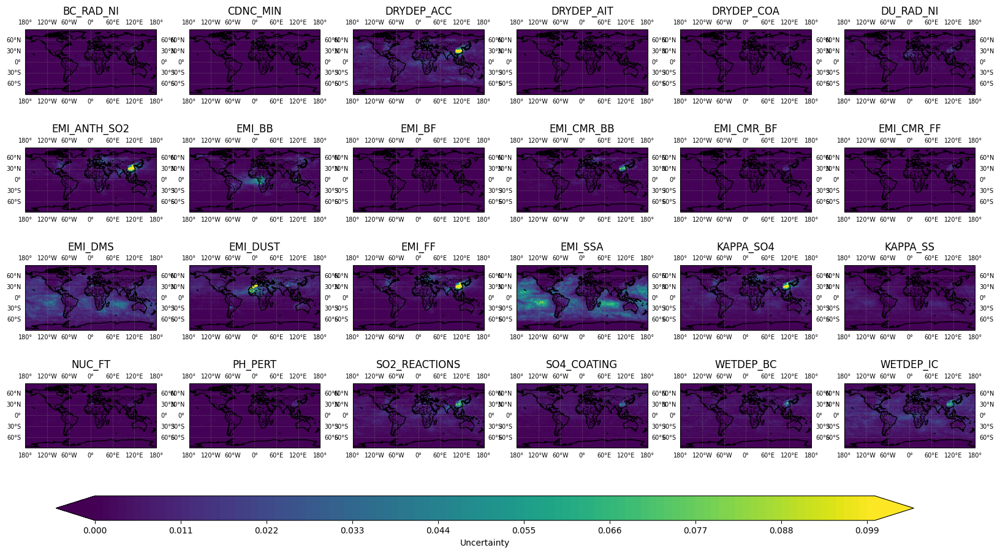

In [34]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import glob
import os

# Path to NetCDF files

#data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Uncertainty_Parameters_for_map/AOD/std/*.nc"
data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Variance_of_parameters/AOD/std/*.nc"

files = sorted(glob.glob(data_path))
#data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Uncertainty_Parameters_for_map/AOD/mean/*.nc"

# Define contour levels and colormap
clevsstd = np.arange(0, 0.1+0.001, 0.001)
cmap = "viridis"

# Read a sample file to get coordinate information
sample_ds = xr.open_dataset(files[0])
lons = sample_ds.lon.values
lats = sample_ds.lat.values

# Create a 5x5 figure grid
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()
#ds_mean = xr.open_dataset(files_mean)['Emulated emulator']

# Loop through files and plot
for i, file in enumerate(files):
    if i >= 24:  # Ensure we don't exceed 5x5 grid
        break

    ds = xr.open_dataset(file)

    var_name = list(ds.data_vars)[0]  # Assume only one variable per file
    data = ds[var_name].values
 #   data_var = (data / ds_mean)
    title = os.path.basename(file).replace("Uncertainty_for_V_SCALE_", "").replace("_variable.nc", "")
    
    # Use your custom plot_map function
    im = plot_map(axes[i], data, lons, lats, "viridis", clevsstd, title, 12)
        
fig.subplots_adjust(hspace=-0.8, wspace=0.25)
# Adjust layout and add colorbar
fig.subplots_adjust(right=0.9)
# cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.02])  # Wider and centered below
# Define a single colorbar spanning all plots
cbar_ax = fig.add_axes([0.15, 0.265, 0.7, 0.02])  # Adjust 'bottom' from 0.08 to 0.12
fig.colorbar(im, cax=cbar_ax, orientation="horizontal", label="Uncertainty")

#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/AOD_Variable_Specific_Effect_Supplimentary.png",dpi=300,bbox_inches = 'tight')


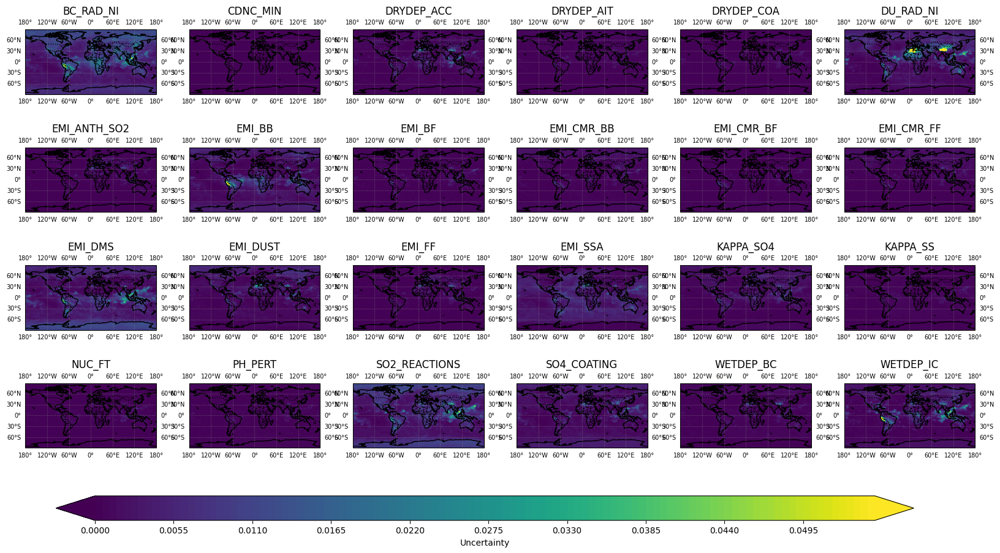

In [35]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import glob
import os

# Path to NetCDF files
#data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Uncertainty_Parameters_for_map/SSA/std/*.nc"
data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Variance_of_parameters/SSA/std/*.nc"

files = sorted(glob.glob(data_path))
#data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Uncertainty_Parameters_for_map/SSA/mean/*.nc"

# Define contour levels and colormap
clevsstd = np.arange(0, 0.05+0.005, 0.0005)
cmap = "viridis"

# Read a sample file to get coordinate information
sample_ds = xr.open_dataset(files[0])
lons = sample_ds.lon.values
lats = sample_ds.lat.values

# Create a 5x5 figure grid
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()
#ds_mean = xr.open_dataset(files_mean)['Emulated emulator']

# Loop through files and plot
for i, file in enumerate(files):
    if i >= 25:  # Ensure we don't exceed 5x5 grid
        break

    ds = xr.open_dataset(file)

    var_name = list(ds.data_vars)[0]  # Assume only one variable per file
    data = ds[var_name].values
 #   data_var = (data / ds_mean)
    title = os.path.basename(file).replace("Uncertainty_for_V_SCALE_", "").replace("_variable.nc", "")
    
    # Use your custom plot_map function
    im = plot_map(axes[i], data, lons, lats, "viridis", clevsstd, title, 12)
        
fig.subplots_adjust(hspace=-0.8, wspace=0.25)
# Adjust layout and add colorbar
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.15, 0.265, 0.7, 0.02])  # Adjust 'bottom' from 0.08 to 0.12
fig.colorbar(im, cax=cbar_ax, orientation="horizontal", label="Uncertainty")

#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/SSA_Variable_Specific_Effect_Supplimentary.png",dpi=100,bbox_inches = 'tight')


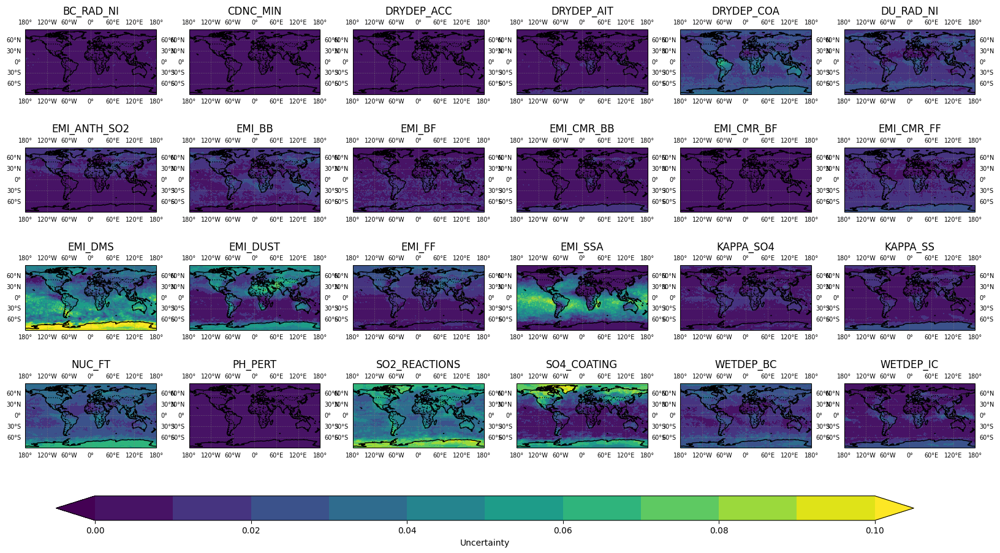

In [36]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import glob
import os

# Path to NetCDF files
#data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Uncertainty_Parameters_for_map/ANG/std/*.nc"
data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Variance_of_parameters/ANG/std/*.nc"

files = sorted(glob.glob(data_path))

# Define contour levels and colormap
clevsstd = np.arange(0, 0.1+0.01, 0.01)
cmap = "viridis"

# Read a sample file to get coordinate information
sample_ds = xr.open_dataset(files[0])
lons = sample_ds.lon.values
lats = sample_ds.lat.values

# Create a 5x5 figure grid
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})

axes = axes.flatten()
#ds_mean = xr.open_dataset(files_mean)['Emulated emulator']

# Loop through files and plot
for i, file in enumerate(files):
    if i >= 25:  # Ensure we don't exceed 5x5 grid
        break

    ds = xr.open_dataset(file)

    var_name = list(ds.data_vars)[0]  # Assume only one variable per file
    data = ds[var_name].values
 #   data_var = (data / ds_mean)
    title = os.path.basename(file).replace("Uncertainty_for_V_SCALE_", "").replace("_variable.nc", "")
    
    # Use your custom plot_map function
    im = plot_map(axes[i], data, lons, lats, "viridis", clevsstd, title, 12)
        
fig.subplots_adjust(hspace=-0.8, wspace=0.25)
# Adjust layout and add colorbar
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.15, 0.265, 0.7, 0.02])  # Adjust 'bottom' from 0.08 to 0.12
fig.colorbar(im, cax=cbar_ax, orientation="horizontal", label="Uncertainty")

#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/ANG_Variable_Specific_Effect_Supplimentary.png",dpi=100,bbox_inches = 'tight')


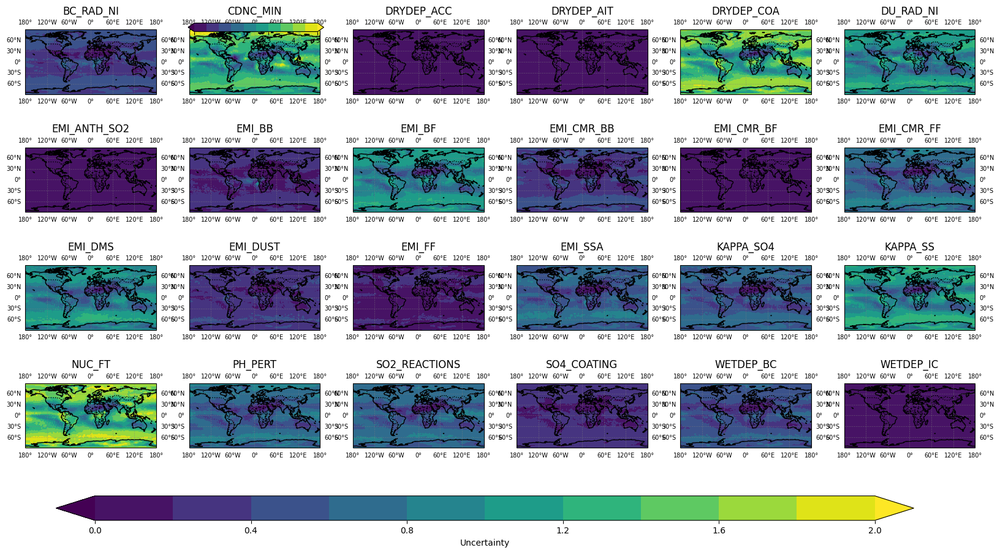

In [37]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import glob
import os

# Path to NetCDF files
data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Uncertainty_Parameters_for_map/Cloud_Cover/std/*.nc"
files = sorted(glob.glob(data_path))

# Define contour levels and colormap
clevsstd = np.arange(0, 2+.2, .2)
cmap = "viridis"
clevsstd_cdnc = np.arange(0, 5+.5, .5)

# Read a sample file to get coordinate information
sample_ds = xr.open_dataset(files[0])
lons = sample_ds.lon.values
lats = sample_ds.lat.values

# Create a 5x5 figure grid
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()
#ds_mean = xr.open_dataset(files_mean)['Emulated emulator']

# Loop through files and plot
for i, file in enumerate(files):
    if i >= 25:  # Ensure we don't exceed 5x5 grid
        break

    ds = xr.open_dataset(file)

    var_name = list(ds.data_vars)[0]  # Assume only one variable per file
    data = ds[var_name].values * 100
 #   data_var = (data / ds_mean)
    title = os.path.basename(file).replace("Uncertainty_for_V_SCALE_", "").replace("_variable.nc", "")
    
    # Use your custom plot_map function
    if i == 1:
        cs = plot_map(axes[i], data, lons, lats, "viridis", clevsstd_cdnc, title, 12)
        # Get the position of the second subplot
        pos = axes[i].get_position()
    
        # Define a new axis for the colorbar directly below this subplot
        cbar_ax = fig.add_axes([pos.x0, pos.y0 - 0.105, pos.width, 0.007])  # Lowered and thinner
        cbar = fig.colorbar(cs, cax=cbar_ax, orientation="horizontal")
        cbar.ax.tick_params(labelsize=7)  # Adjust the tick size as needed

    else:
        im = plot_map(axes[i], data, lons, lats, "viridis", clevsstd, title, 12)

fig.subplots_adjust(hspace=-0.8, wspace=0.25)
# Adjust layout and add colorbar
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.15, 0.265, 0.7, 0.02])  # Adjust 'bottom' from 0.08 to 0.12
fig.colorbar(im, cax=cbar_ax, orientation="horizontal", label="Uncertainty")

#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/Cloud_Cover_Variable_Specific_Effect_Supplimentary.png",dpi=100,bbox_inches = 'tight')


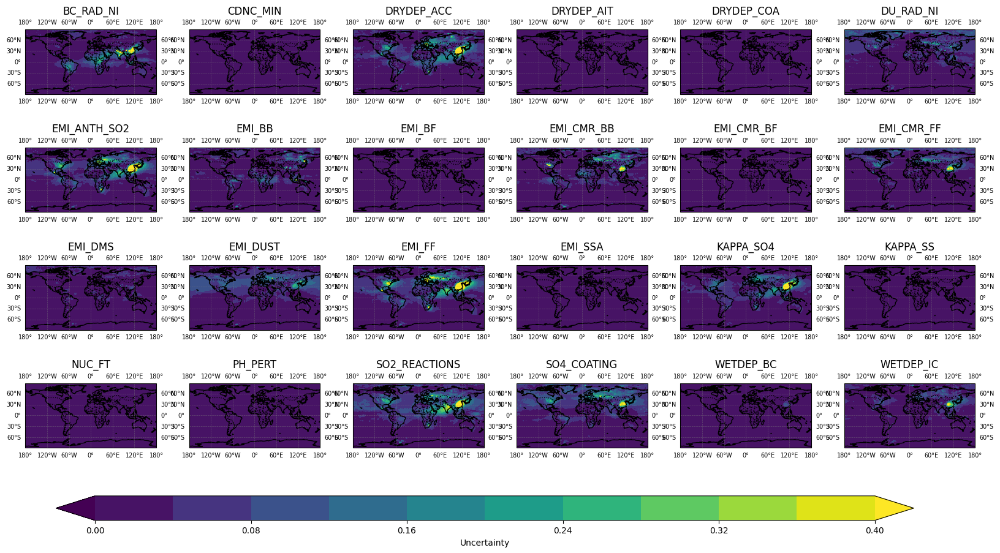

In [52]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import glob
import os

# Path to NetCDF files
data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Variance_of_parameters/ERF_ARI/std/*.nc"
files = sorted(glob.glob(data_path))
#data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Uncertainty_Parameters_for_map/SSA/mean/*.nc"

# Define contour levels and colormap
clevsstd = np.arange(0, 0.4+0.04, 0.04)
cmap = "viridis"

# Read a sample file to get coordinate information
sample_ds = xr.open_dataset(files[0])
lons = sample_ds.lon.values
lats = sample_ds.lat.values

# Create a 5x5 figure grid
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()
#ds_mean = xr.open_dataset(files_mean)['Emulated emulator']

# Loop through files and plot
for i, file in enumerate(files):
    if i >= 25:  # Ensure we don't exceed 5x5 grid
        break

    ds = xr.open_dataset(file)

    var_name = list(ds.data_vars)[0]  # Assume only one variable per file
    data = ds[var_name].values
 #   data_var = (data / ds_mean)
    title = os.path.basename(file).replace("Uncertainty_for_V_SCALE_", "").replace("_variable.nc", "")
    
    # Use your custom plot_map function
    im = plot_map(axes[i], data, lons, lats, "viridis", clevsstd, title, 12)
        
fig.subplots_adjust(hspace=-0.8, wspace=0.25)
# Adjust layout and add colorbar
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.15, 0.265, 0.7, 0.02])  # Adjust 'bottom' from 0.08 to 0.12
fig.colorbar(im, cax=cbar_ax, orientation="horizontal", label="Uncertainty")

#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/ERF_ARI_Cover_Variable_Specific_Effect_Supplimentary.png",dpi=100,bbox_inches = 'tight')


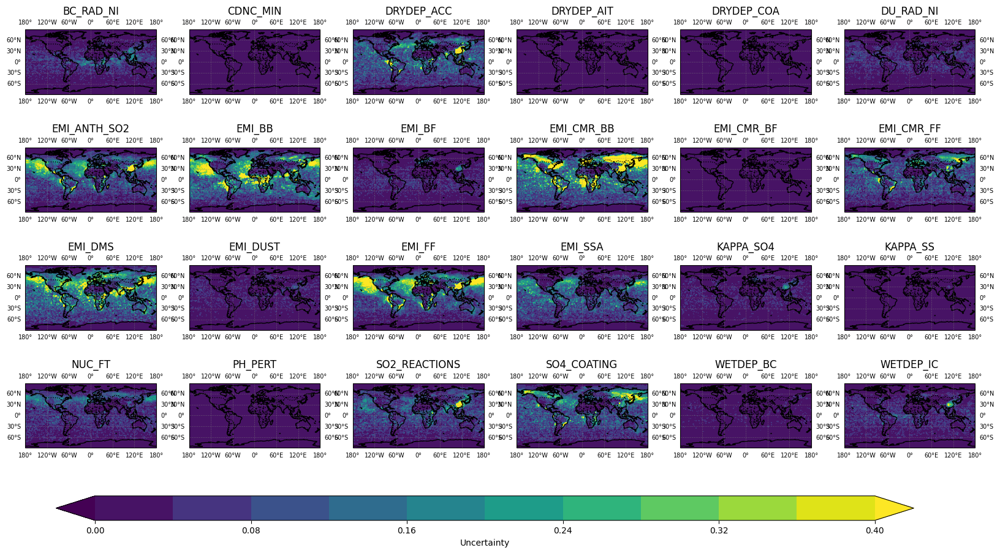

In [38]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import glob
import os

# Path to NetCDF files
data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Variance_of_parameters/ERF_ACI/std/*.nc"
files = sorted(glob.glob(data_path))
#data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Uncertainty_Parameters_for_map/SSA/mean/*.nc"

# Define contour levels and colormap
clevsstd = np.arange(0, 0.4+0.04, 0.04)
cmap = "viridis"

# Read a sample file to get coordinate information
sample_ds = xr.open_dataset(files[0])
lons = sample_ds.lon.values
lats = sample_ds.lat.values

# Create a 5x5 figure grid
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()
#ds_mean = xr.open_dataset(files_mean)['Emulated emulator']

# Loop through files and plot
for i, file in enumerate(files):
    if i >= 25:  # Ensure we don't exceed 5x5 grid
        break

    ds = xr.open_dataset(file)

    var_name = list(ds.data_vars)[0]  # Assume only one variable per file
    data = ds[var_name].values
 #   data_var = (data / ds_mean)
    title = os.path.basename(file).replace("Uncertainty_for_V_SCALE_", "").replace("_variable.nc", "")
    
    # Use your custom plot_map function
    im = plot_map(axes[i], data, lons, lats, "viridis", clevsstd, title, 12)
        
fig.subplots_adjust(hspace=-0.8, wspace=0.25)
# Adjust layout and add colorbar
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.15, 0.265, 0.7, 0.02])  # Adjust 'bottom' from 0.08 to 0.12
fig.colorbar(im, cax=cbar_ax, orientation="horizontal", label="Uncertainty")

#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/ERF_ACI_Variable_Specific_Effect_Supplimentary.png",dpi=100,bbox_inches = 'tight')


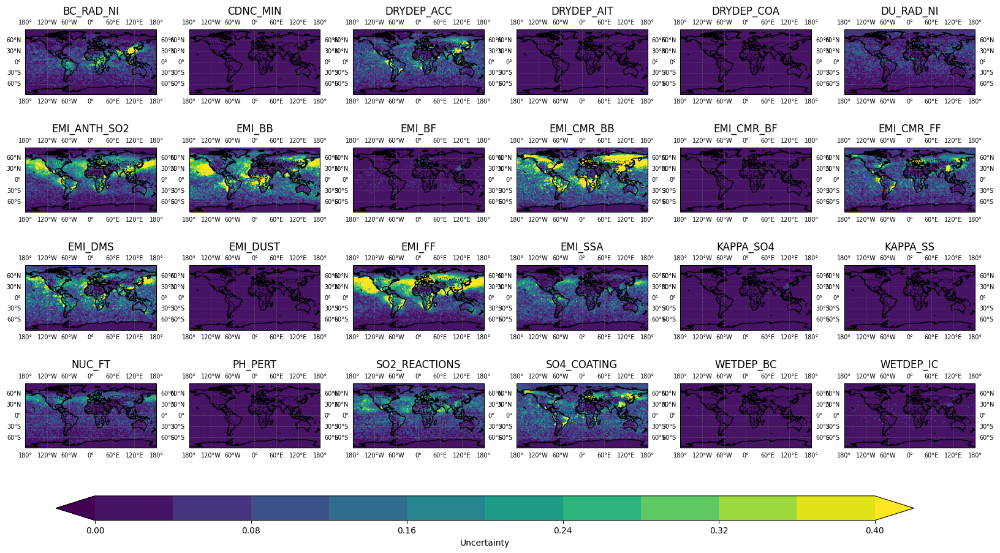

In [39]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import glob
import os

# Path to NetCDF files
data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Variance_of_parameters/ERF/std/*.nc"
files = sorted(glob.glob(data_path))
#data_path = "/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Uncertainty_Parameters_for_map/SSA/mean/*.nc"

# Define contour levels and colormap
clevsstd = np.arange(0, 0.4+0.04, 0.04)
cmap = "viridis"

# Read a sample file to get coordinate information  
sample_ds = xr.open_dataset(files[0])
lons = sample_ds.lon.values
lats = sample_ds.lat.values

# Create a 5x5 figure grid
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()
#ds_mean = xr.open_dataset(files_mean)['Emulated emulator']

# Loop through files and plot
for i, file in enumerate(files):
    if i >= 25:  # Ensure we don't exceed 5x5 grid
        break

    ds = xr.open_dataset(file)

    var_name = list(ds.data_vars)[0]  # Assume only one variable per file
    data = ds[var_name].values
 #   data_var = (data / ds_mean)
    title = os.path.basename(file).replace("Uncertainty_for_V_SCALE_", "").replace("_variable.nc", "")
    
    # Use your custom plot_map function
    im = plot_map(axes[i], data, lons, lats, "viridis", clevsstd, title, 12)
        
fig.subplots_adjust(hspace=-0.8, wspace=0.25)
# Adjust layout and add colorbar
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.15, 0.265, 0.7, 0.02])  # Adjust 'bottom' from 0.08 to 0.12
fig.colorbar(im, cax=cbar_ax, orientation="horizontal", label="Uncertainty")

#plt.show()
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/ERF_Variable_Specific_Effect_Supplimentary.png",dpi=100,bbox_inches = 'tight')


## Supplimentary materials 2

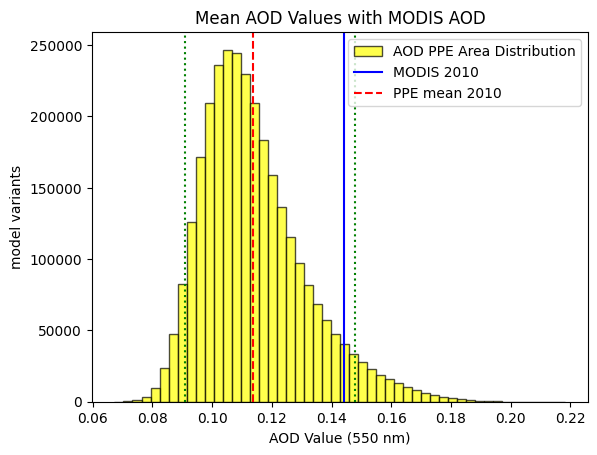

In [96]:
aod_modis = xr.open_mfdataset('/home/ybhatti/prjs1076/Observational_Data/2003-2014/regridded/g4.timeAvg.MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.2010*',combine='nested',concat_dim='month').MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.load().mean('month')
lats_modis = aod_modis.mean('lon')
AOD_PPE_area = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/AOD_areaweighted_3_million.nc')['__xarray_dataarray_variable__'][:].load()

aod_modis_area = areaweight(aod_modis,lats_modis)

#plt.plot(AOD_PPE_area, color='yellow')

plt.hist(AOD_PPE_area, bins=50, color='yellow', edgecolor='black', alpha=0.7, label='AOD PPE Area Distribution')

plt.axvline(aod_modis_area, color='blue', linestyle='-',label='MODIS 2010')
plt.axvline(np.mean(AOD_PPE_area), color='red', linestyle='--',label='PPE mean 2010')
plt.axvline(np.percentile(AOD_PPE_area,95), color='green', linestyle=':')
plt.axvline(np.percentile(AOD_PPE_area,5), color='green', linestyle=':')

plt.title('Mean AOD Values with MODIS AOD')

plt.ylabel('model variants')
plt.xlabel('AOD Value (550 nm)')
plt.legend()

In [40]:
# Load region masks
regions_nn = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/reg_18_regridded_nn.nc').reg
# Stack lat and lon into one dimension to sample from all spatial locations

# Load datasets for AOD, SSA, and ANG
aod_nanned = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_ERF_3000000.nc')['Emulated emulator'][:100000].load()
#aod_nanned = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/ERF_uncertainty_3000000.nc')['Emulated emulator'][:1000].load()

#random_samples = np.random.choice(gp_prediction_aod.sizes["sample"], size=40000, replace=False)
#aod_nanned = gp_prediction_aod.isel(sample=random_samples)

# # Load SSA Data
# ssa_nanned = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_ERF_ACI_3000000.nc')['Emulated emulator'][:100000].load()
# #ssa_nanned = gp_prediction_ssa.isel(sample=random_samples)

# # Load ANG Data
# ang_nanned = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/CDNC_40/Total_ERF_ARI_3000000.nc')['Emulated emulator'][:100000].load()
# #ang_nanned = gp_prediction_ang.isel(sample=random_samples)


In [41]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr


# Define regions and their corresponding numerical indices
regions_cat = {
    "Arctic Ocean": 1, "Arctic Land": 2, "North Pacific Ocean": 3, "North America": 4,
    "North Atlantic Ocean": 5, "Europe": 6, "Asia": 7, "Tropical Pacific Ocean": 8,
    "Tropical Atlantic Ocean": 9, "Africa": 10, "Tropical Indian Ocean": 11,
    "South Pacific Ocean": 12, "South America": 13, "South Atlantic Ocean": 14,
    "South Indian Ocean": 15, "Australia": 16, "Antarctic Ocean": 17, "Antarctica": 18,
    "Global": 19
}

# Prepare data storage
boxplot_data_aod, boxplot_data_ssa, boxplot_data_ang = [], [], []
polder_means_aod, polder_means_ssa, polder_means_ang = [], [], []
boxplot_data_aod_control, boxplot_data_ssa_control, boxplot_data_ang_control = [], [], []

# Loop through each region to compute statistics
for region_name, r in regions_cat.items():
    # AOD Processing
    region_gp_aod = Interpolate_Regional_uncertainty(aod_nanned, r, regions_nn).transpose("sample","lat", "lon")
    gpmeans_aod = areaweight(region_gp_aod, region_gp_aod.lat)
    boxplot_data_aod.append(gpmeans_aod.values)
    #boxplot_data_aod_control.append(gpmeans_aod[0].values)
    
    # # SSA Processing
    # region_gp_ssa = Interpolate_Regional_uncertainty(ssa_nanned, r, regions_nn).transpose("sample", "lat", "lon")
    # gpmeans_ssa = areaweight(region_gp_ssa, region_gp_ssa.lat)
    # boxplot_data_ssa.append(gpmeans_ssa.values)
    # boxplot_data_ssa_control.append(gpmeans_ssa[0].values)


    # # ANG Processing
    # region_gp_ang = Interpolate_Regional_uncertainty(ang_nanned, r, regions_nn).transpose("sample", "lat", "lon")
    # gpmeans_ang = areaweight(region_gp_ang, region_gp_ang.lat)
    # boxplot_data_ang.append(gpmeans_ang.values)
    # boxplot_data_ang_control.append(gpmeans_ang[0].values)

    print(r)
    if r == 18: # Breaking the 18th region for GLOBAL
        break

# Ensure global statistics are included
boxplot_data_aod.append(areaweight(aod_nanned, aod_nanned.lat).values)
boxplot_data_aod_control.append(areaweight(aod_nanned[0], aod_nanned.lat).values)

# boxplot_data_ssa.append(areaweight(ssa_nanned, ssa_nanned.lat).values)
# boxplot_data_ssa_control.append(areaweight(ssa_nanned[0], ssa_nanned.lat).values)

# boxplot_data_ang.append(areaweight(ang_nanned, ang_nanned.lat).values)
#boxplot_data_ang_control.append(areaweight(ang_nanned[0], ang_nanned.lat).values)

ppe_aod_mean = np.nanmean(boxplot_data_aod,axis=1); ppe_aod_std = np.nanstd(boxplot_data_aod,axis=1)
# ppe_ssa_mean = np.nanmean(boxplot_data_ssa,axis=1); ppe_ssa_std = np.nanstd(boxplot_data_ssa,axis=1)
# ppe_ang_mean = np.nanmean(boxplot_data_ang,axis=1); ppe_ang_std = np.nanstd(boxplot_data_ang,axis=1)

# Map means to regions
region_names = list(regions_cat.keys())

# Separate means into ocean and land categories, excluding Arctic/Antarctic regions
# ocean_means = [mean for region, mean in zip(region_names, ppe_ssa_mean)
#                if "Ocean" in region and "Arctic" not in region and "Antarctic" not in region]
# land_means = [mean for region, mean in zip(region_names, ppe_ssa_mean)
#               if "Ocean" not in region and "Arctic" not in region and "Antarctic" not in region]

# ocean_std = [mean for region, mean in zip(region_names, ppe_ssa_std)
#                if "Ocean" in region and "Arctic" not in region and "Antarctic" not in region]
# land_std = [mean for region, mean in zip(region_names, ppe_ssa_std)
#               if "Ocean" not in region and "Arctic" not in region and "Antarctic" not in region]

# land_std = np.array(land_std)
# land_means = np.array(land_means)
# ocean_std = np.array(ocean_std)
# ocean_means = np.array(ocean_means)
# print(f"Land is {((land_means.mean()/ocean_means.mean())-1)*100} % over oceans")
# print(f"Land relative uncertainty is {((land_std.mean()/ocean_std.mean())-1)*100} % over ocean")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


0.15256279519423377


NameError: name 're' is not defined

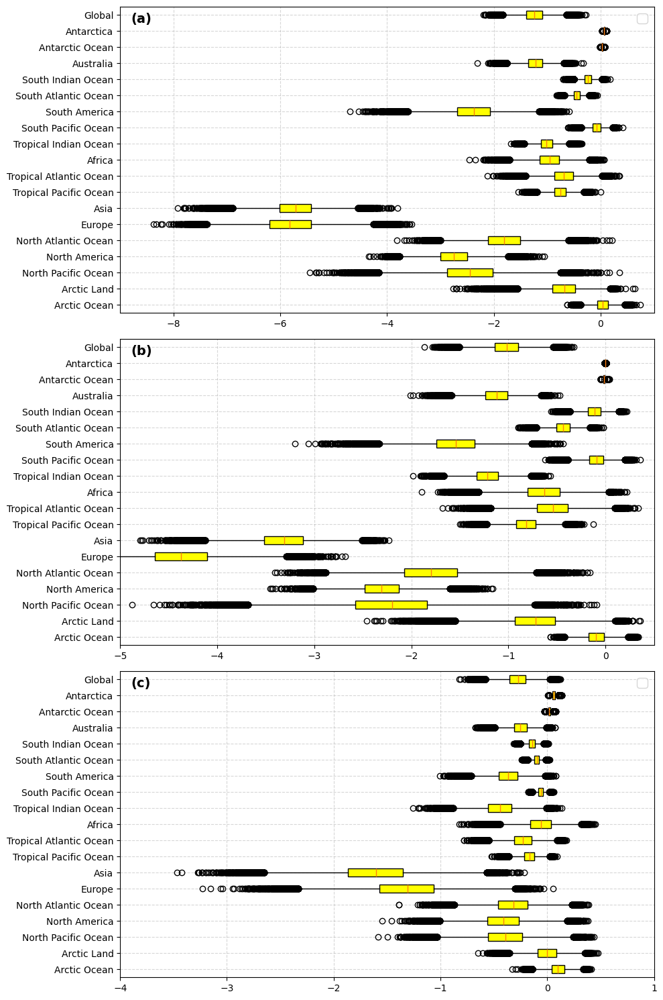

In [6]:
fig, axes = plt.subplots(3, 1, figsize=(10, 15), sharex=False)

metrics = [
    (boxplot_data_aod, boxplot_data_aod_control, "ERF (W m-2)", (-9, 1)),# np.linspace(-10, , 5)),
    (boxplot_data_ssa, boxplot_data_ssa_control, "ACI (W m-2)", (-5, 0.5)),# np.linspace(0.8, 1.0, 5))
    (boxplot_data_ang, boxplot_data_ang_control, "ARI (W m-2)", (-4, 1))# np.linspace(0.5, 2, 4)),

]

subplot_labels = ["(a)", "(b)", "(c)"]

for ax, (box_data, control_means, xlabel, xlim), label in zip(axes, metrics, subplot_labels):
    boxprops = ax.boxplot(box_data, vert=False, labels=list(regions_cat.keys()), patch_artist=True, 
                          boxprops=dict(facecolor='yellow'))

    # for i, mean in enumerate(polder_means):
    #     ax.plot(mean, i + 1, 'ro', markersize=8, label="POLDER Mean" if i == 0 else "")
    # for i, mean in enumerate(control_means):
    #     ax.plot(mean, i + 1, 'ro',color='blue', markersize=8, label="Control" if i == 0 else "")

   # ax.set_xlabel(xlabel)#,fontweight=')
    ax.grid(True, linestyle="--", alpha=0.5)
    

    # Add subplot label at the top-left
    ax.text(0.02, 0.98, label, transform=ax.transAxes, fontsize=14, fontweight='bold', 
            va='top', ha='left')

    # Set x-axis limits and ticks
    ax.set_xlim(xlim)
 #   ax.set_xticks(xticks)
axes[0].legend(loc='upper right',fontsize=14)
axes[2].legend(loc='upper right',fontsize=14)

plt.tight_layout()
# plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PPE_Observation_BOX_AOD_SSA_ANG_2010.png", dpi=100, bbox_inches='tight')
# plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/PPE_Observation_BOX_AOD_SSA_ANG_2010.pdf", dpi=100, bbox_inches='tight')
for i in range(0,len(boxplot_data_aod)):
    print(np.std(boxplot_data_aod[i]))
    print(re)

In [42]:
for region_name, r in regions_cat.items():
    print(region_name)
    r=r-1
    print(f"std = {np.std(boxplot_data_aod[r])}")
    print(f"mean = {np.mean(boxplot_data_aod[r])}")
    print(f"5th % = {np.percentile(boxplot_data_aod[r],5)}")
    print(f"95th % {np.percentile(boxplot_data_aod[r],95)}")
    print(f"% {((np.percentile(boxplot_data_aod[r],5)/np.percentile(boxplot_data_aod[r],95)-1)*100)}")
    print('----')

Arctic Ocean
std = 0.15256279519423377
mean = 0.03774684614129608
5th % = -0.21553442406903361
95th % 0.2868905125055759
% -175.12776291786386
----
Arctic Land
std = 0.3352478907343106
mean = -0.7083225836842618
5th % = -1.302020972120887
95th % -0.20915945923251875
% 522.5015961020698
----
North Pacific Ocean
std = 0.6393032443704217
mean = -2.4572074941555706
5th % = -3.5254354584451724
95th % -1.4229890144663941
% 147.74860681318563
----
North America
std = 0.37618186972283735
mean = -2.74725977426197
5th % = -3.3541369349113164
95th % -2.1155540230651977
% 58.54650357978344
----
North Atlantic Ocean
std = 0.44378804687463813
mean = -1.803494040280961
5th % = -2.526089794685004
95th % -1.0664942995404314
% 136.85919331903924
----
Europe
std = 0.5780245808078422
mean = -5.814365558539871
5th % = -6.75303222598891
95th % -4.851823238660253
% 39.185454494291164
----
Asia
std = 0.4435702658507767
mean = -5.725248409284703
5th % = -6.4713164776126275
95th % -5.012868134157937
% 29.094089

In [13]:
china_region = aod_nanned.sel(lat=slice(54, 18), lon=slice(73, 135))
china_region = aod_nanned.sel(lat=slice(55, 15), lon=slice(70, 140))

chi = areaweight(china_region,china_region.lat)
mean = -7.24461242
std = 0.454623
print(np.percentile(chi,5)/np.percentile(chi,95))


1.2500629574639919


In [ ]:
def randomly_sample_emsemble(data,n,):
    first_sample = data.isel(sample=0)
    # Step 2: Randomly sample n points from the remaining data
    # Exclude the first sample (index 0) when sampling
    remaining_samples = data.isel(sample=slice(1, None))  # Exclude the first sample
    random_indices = np.random.choice(remaining_samples.sample.size, size=n, replace=False)
    random_samples = remaining_samples.isel(sample=random_indices)
    
    # Step 3: Combine the first sample with the randomly sampled points
    sampled_data = xr.concat([first_sample, random_samples], dim="sample")
    # Step 4: Transpose the dimensions to (lat, lon, sample)
    sampled_data_transposed = sampled_data.transpose("sample","lat", "lon")

    return sampled_data_transposed

gp_prediction_ssa = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Total_SSA_Comparison_POLDER_900000.nc')['Emulated __xarray_dataarray_variable__']#[:100000].load()
gp_prediction_aod = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Total_AOD_Comparison_POLDER_900000.nc')['Emulated TAU_2D_550nm']#[:100000].load()
gp_prediction_ang = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/Total_ANG_Comparison_POLDER_900000.nc')['Emulated ANG_550nm_865nm']#[:100000].load()
SSA_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2010/SSA_PPE_Pre_Emulator.nc').mean('month').load().__xarray_dataarray_variable__
ANG_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2010/ANG_PPE_Pre_Emulator.nc').mean('month').load().ANG_550nm_865nm
AOD_PPE = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/PD/Observational_Comparison/Processed/POLDER/2010/AOD_PPE_Pre_Emulator.nc').mean('month').load().TAU_2D_550nm

gp_prediction_aod = randomly_sample_emsemble(gp_prediction_aod,50000)
gp_prediction_ssa = randomly_sample_emsemble(gp_prediction_ssa,50000)
gp_prediction_ang = randomly_sample_emsemble(gp_prediction_ang,50000)
gp_prediction_aod = xr.where(gp_prediction_aod == 0, np.nan, gp_prediction_aod)
gp_prediction_ssa = xr.where(gp_prediction_ssa == 0, np.nan, gp_prediction_ssa)
gp_prediction_ang = xr.where(gp_prediction_ang == 0, np.nan, gp_prediction_ang)

# AOD_PPE = AOD_PPE.fillna(0)
# SSA_PPE = SSA_PPE.fillna(0)
# ANG_PPE = ANG_PPE.fillna(0)
ssa_nanned = gp_prediction_ssa.where(~np.isnan(SSA_PPE[-1]))
aod_nanned = gp_prediction_aod.where(~np.isnan(AOD_PPE[-1]))
ang_nanned = gp_prediction_ang.where(~np.isnan(ANG_PPE[-1]))
POLDER_AOD = AOD_PPE[-1]
POLDER_SSA = SSA_PPE[-1]
POLDER_ANG = ANG_PPE[-1]

Fig_3_file='/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/Raw/'

variables = [ 'AOD', 'SSA', 'ANG']
types = ['uncertainty', 'areaweighted', 'mean']

# Use dictionary comprehension for clarity and efficiency
Fig_3 = {
    f"{var}_{typ}": xr.open_dataset(f"{Fig_3_file}{var}_{typ}_3_million.nc")
    for var in variables for typ in types
}
dimension = ['TAU_2D_550nm','emulator','Emulated ANG_550nm_865nm']

from scipy.stats import stats
n = 10000
POLDER_Data_SSA = SSA_PPE[-1].data.flatten()
POLDER_PPE_SSA  = gp_prediction_ssa.data.flatten()
flat_PPE_SSA = POLDER_PPE_SSA[~np.isnan(POLDER_PPE_SSA)]
obs_spatial_SSA = POLDER_Data_SSA[~np.isnan(POLDER_Data_SSA)]
dots_ssa=find_diffs(gp_prediction_ssa,SSA_PPE[-1],0)

POLDER_Data_AOD = AOD_PPE[-1].data.flatten()
POLDER_PPE_AOD  = gp_prediction_aod.data.flatten()
flat_PPE_AOD = POLDER_PPE_AOD[~np.isnan(POLDER_PPE_AOD)]
obs_spatial_AOD = POLDER_Data_AOD[~np.isnan(POLDER_Data_AOD)]
dots_aod=find_diffs(gp_prediction_aod,AOD_PPE[-1],0)

POLDER_Data_ANG = ANG_PPE[-1].data.flatten()
POLDER_PPE_ANG  = gp_prediction_ang.data.flatten()
flat_PPE_ANG = POLDER_PPE_ANG[~np.isnan(POLDER_PPE_ANG)]
obs_spatial_ANG = POLDER_Data_ANG[~np.isnan(POLDER_Data_ANG)]
dots_ang=find_diffs(gp_prediction_ang,ANG_PPE[-1],0)

coolwarm_data_diff = plt.cm.coolwarm(np.linspace(0, 1, 256))
coolwarm_data_diff[110:140, :] = 1.0  # Set values from index 128 to 384 as white
coolwarm_white = LinearSegmentedColormap.from_list('coolwarm_white', coolwarm_data_diff)


In [ ]:
aod_modis = xr.open_mfdataset('/home/ybhatti/prjs1076/Observational_Data/2003-2014/regridded/g4.timeAvg.MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.2010*',combine='nested',concat_dim='month').MYD08_M3_6_1_AOD_550_Dark_Target_Deep_Blue_Combined_Mean_Mean.load().mean('month')
lats_modis = aod_modis.mean('lon')
AOD_PPE_area = xr.open_dataset('/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/AOD_areaweighted_3_million.nc')['__xarray_dataarray_variable__'][:].load()


data=[]
for v in range(0,6):
    mean=areaweight(combined[v],lats)
    data.append(mean)

meaned = xr.concat(data, dim="modes")
mean_aod_modes = meaned[:,:].mean(dim='sample')
std_aod_modes = meaned[:,:].std(dim='sample')

# Assuming AOD_PI and lats are already defined and contain the relevant data
mean_aod = areaweight(AOD_PPE, lats).mean(dim='sample')  # Mean across ensemble
std_aod = areaweight(AOD_PPE, lats).std(dim='sample')    # Standard deviation across ensemble

# Check the values
print("Mean AOD:", mean_aod.item())
print("Standard Deviation:", std_aod.item())


# Create a figure with two subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# --- Top Plot: Mean AOD with Standard Deviation ---
# Plotting mean AOD over time
axs[0].plot(areaweight(AOD_PPE, lats), label='Mean AOD over Time', color='black')

# Mean value
mean_value = mean_aod.item()  # Get the scalar value
std_value = std_aod.item()    # Get the scalar value for standard deviation

# Plot a horizontal line at the mean value
axs[0].axhline(mean_value, color='blue', linestyle='-', label='Mean AOD')

# Shade the area for mean ± std
axs[0].fill_between(
    range(areaweight(AOD_PPE, lats).shape[0]),  # Extend over the x-coordinates of the data
    mean_value - std_value,                    # Lower bound
    mean_value + std_value,                    # Upper bound
    color='lightgray',                         # Shaded color
    alpha=0.5,                                # Transparency
    label='Mean ± Std Dev'
)

# Adding titles and labels
axs[0].set_title('Mean AOD with Standard Deviation')
axs[0].set_ylabel('AOD Value')
axs[0].set_xlabel('Ensemble Member')
axs[0].set_yticks(np.arange(0, mean_value + 2*std_value, 0.01))  # Adjust as needed based on your data
axs[0].axhline(mean_value - std_value, color='red', linestyle='--', label='Mean - Std Dev')
axs[0].axhline(mean_value + std_value, color='green', linestyle='--', label='Mean + Std Dev')
axs[0].legend()
axs[0].grid(True)

# --- Bottom Plot: Mean AOD Values with Error Bars ---
# Create the line plot for mean AOD with error bars
axs[1].errorbar(
    range(mean_aod_modes.size),      # x (modes)
    mean_aod_modes.values,          # y (mean values)
    yerr=std_aod_modes.values,      # error (standard deviation)
    fmt='o-',                  # style
    capsize=5,                 # Cap size for error bars
    label='Mean AOD with Std Dev'
)
plt.plot(
    range(meaned[:,0].size),  # x (modes)
    meaned[:,0].values,      # y (mean values)
    label='Control AOD Mode'
)


# Adding titles and labels
axs[1].set_title('Mean AOD Values with Error Bars')
axs[1].set_xlabel('Modes')
axs[1].set_ylabel('Mean AOD Value (550 nm)')
axs[1].set_xticks(ticks=range(mean_aod_modes.size))
axs[1].set_xticklabels(variables, rotation=45)
axs[1].legend()
axs[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


# Old Plots

/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/ybhatti/yusufb/miniconda3/envs/ESM/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 

NameError: name 'dots_aod' is not defined

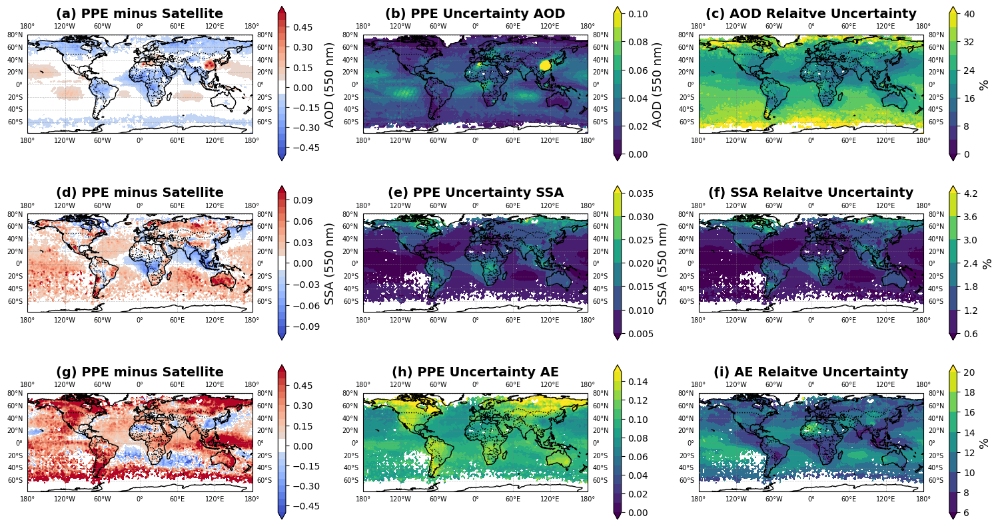

In [5]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Create figure
fig = plt.figure(figsize=(18, 12))

# Define grid for 3 rows, 3 columns with adjusted width ratios
grid = plt.GridSpec(3, 3, wspace=0.3, hspace=-0.3)

# Map Subplots
map_axes = [
    fig.add_subplot(grid[i, j], projection=ccrs.PlateCarree()) 
    for i in range(3) for j in range(3)
]
# Contour Levels
clevs_diff_aod = np.arange(-0.5, 0.5 + 0.1, 0.05)

clevs_diff_ssa = np.arange(-0.1, 0.1 + 0.01, 0.01)
clevs_diff_ang = np.arange(-0.5, 0.5 + 0.1, 0.05)
## AOD
clevs1 = np.arange(0, 0.5 + 0.1, 0.1)
clevsstd1 = np.arange(0, 1 + 0.1, 0.1)
clevs_std_aod = np.arange(0, 0.1 + 0.01, 0.01)

## SSA
clevs5=np.arange(0.7,1+0.01,0.01)
clevsstd5=np.arange(0,0.1+0.02,0.01)
clevs_std_ssa = np.arange(0.032, 0.036 + 0.0001, 0.0001)

#ANG
clevs_ang=np.arange(0,2+0.2,0.2)
clevs_std_ang = np.arange(0, 0.15 + 0.01, 0.01)


clevs_var_aod = np.arange(0, 40 + 4, 4)   # Variability (std/mean)
clevs_var_ang = np.arange(6, 20 + 2, 2)   # Variability (std/mean)

diff_aod = aod_nanned.mean('sample') - AOD_PPE[-1]
diff_ssa = ssa_nanned.mean('sample') - SSA_PPE[-1]
diff_ang = ang_nanned.mean('sample') - ANG_PPE[-1]

# Compute std/mean for each variable
AOD_var = aod_nanned.std('sample') / aod_nanned.mean('sample') * 100
SSA_var = ssa_nanned.std('sample') / ssa_nanned.mean('sample') * 100
ANG_var = ang_nanned.std('sample') / ang_nanned.mean('sample') * 100

# Plot the variability (std/mean)
# plot_with_colorbar(var_axes[0], AOD_var, AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs_var_aod, '(d) AOD Relaitve Uncertainty','%')
# plot_with_colorbar(var_axes[1], SSA_var, SSA_PPE.lon, SSA_PPE.lat, 'viridis', None, '(e) SSA Relaitve Uncertainty','%')
# plot_with_colorbar(var_axes[2], ANG_var, ANG_PPE.lon, ANG_PPE.lat, 'viridis', clevs_var_ang, '(f) AE Relaitve Uncertainty','%')

# Define colormap
cmap_diff = 'coolwarm'  # Diverging colormap for differences
cmap_std = 'viridis'  # Per your request

coolwarm_data_diff = plt.cm.coolwarm(np.linspace(0, 1, 256))
coolwarm_data_diff[110:140, :] = 1.0  # Set values from index 128 to 384 as white
coolwarm_white = LinearSegmentedColormap.from_list('coolwarm_white', coolwarm_data_diff)

# Function to plot with colorbar (resized to fit subplot size)
def plot_with_colorbar(ax, data, lon, lat, cmap, clevs, title, Cbar_Title):
    img = plot_map(ax, data, lon, lat, cmap, clevs)  # Assuming plot_map returns an image
    cbar = plt.colorbar(img, ax=ax, orientation='vertical', fraction=0.03, pad=0.1)  # Increased pad
    cbar.ax.tick_params(labelsize=10)
    ax.set_title(title, fontsize=14, fontweight='bold')
    cbar.set_label(f'{Cbar_Title}',fontsize=13)

#cs1 = plot_map(ax[i][0], Fig_2[f'{var}_mean'][f'Emulated {dimension[i]}'].data, lons, lats, cmap[i], clevs[i],f'{var}',10,gridline_kwargs=gridline_options, log_scale=False)
# Plot Maps with Colorbars
plot_with_colorbar(map_axes[0+2], AOD_var, AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs_var_aod, '(c) AOD Relaitve Uncertainty','%')
plot_with_colorbar(map_axes[1-1], diff_aod, AOD_PPE.lon, AOD_PPE.lat, coolwarm_white, clevs_diff_aod, '(a) PPE minus Satellite','AOD (550 nm)')
plot_with_colorbar(map_axes[2-1], aod_nanned.std('sample'), AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs_std_aod, '(b) PPE Uncertainty AOD','AOD (550 nm)')

plot_with_colorbar(map_axes[3+2], SSA_var, SSA_PPE.lon, SSA_PPE.lat, 'viridis', None, '(f) SSA Relaitve Uncertainty','%')
plot_with_colorbar(map_axes[4-1], diff_ssa, SSA_PPE.lon, SSA_PPE.lat, coolwarm_white, clevs_diff_ssa, '(d) PPE minus Satellite','SSA (550 nm)')
plot_with_colorbar(map_axes[5-1], ssa_nanned.std('sample'), SSA_PPE.lon, SSA_PPE.lat, 'viridis', None, '(e) PPE Uncertainty SSA','SSA (550 nm)')

plot_with_colorbar(map_axes[6+2], ANG_var, ANG_PPE.lon, ANG_PPE.lat, 'viridis', clevs_var_ang, '(i) AE Relaitve Uncertainty','%')
plot_with_colorbar(map_axes[7-1], diff_ang, ANG_PPE.lon, ANG_PPE.lat, coolwarm_white, clevs_diff_ang, '(g) PPE minus Satellite', '')
plot_with_colorbar(map_axes[8-1], ang_nanned.std('sample'), ANG_PPE.lon, ANG_PPE.lat, 'viridis', clevs_std_ang, '(h) PPE Uncertainty AE', '')

# Statistical Significance Overlay
for i, (dots, dataset) in enumerate([(dots_aod, AOD_PPE), 
                                      (dots_ssa, SSA_PPE), 
                                      (dots_ang, ANG_PPE)]):
    # Getting indices of significant dots
    m, n = np.where(dots == 1)
    
    # Creating a mask for significant regions
    mask = np.zeros(dots.shape)
    mask[m, n] = 1  # Highlight statistically significant regions (1 for significance)
    
    # Accessing correct subplot axes (from map_axes)
    ax_i = map_axes[i * 3 + 2]  # Targets the second column in each row

    # Overlay contour for significance, using 'hatches' for highlighting
    ax_i.contourf(dataset.lon, dataset.lat, mask, 1, hatches=['', '..'], alpha=0)
    
    ax_i = map_axes[i * 3 + 1]  # Targets the second column in each row
    ax_i.contourf(dataset.lon, dataset.lat, mask, 1, hatches=['', '..'], alpha=0)

# Adjust layout
plt.tight_layout()
#plt.show()
# plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/PPE_Observation_Comparison_2010.png",dpi=300,bbox_inches = 'tight')
# plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/PPE_Observation_Comparison_2010.pdf",dpi=300,bbox_inches = 'tight')


In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

fig = plt.figure(figsize=(15, 15))

# Define grid layout for 2 rows, 3 columns
grid = plt.GridSpec(2, 3, wspace=0.3, hspace=-0.75)

# Map Subplots (First row)
map_axes = [
    fig.add_subplot(grid[0, 0], projection=ccrs.PlateCarree()),  # POLDER AOD 2009
    fig.add_subplot(grid[0, 1], projection=ccrs.PlateCarree()),  # POLDER SSA 2009
    fig.add_subplot(grid[0, 2], projection=ccrs.PlateCarree())   # POLDER ANG 2009
]

# Variability (std/mean) Subplots (Second row)
var_axes = [
    fig.add_subplot(grid[1, 0], projection=ccrs.PlateCarree()),  # AOD variability
    fig.add_subplot(grid[1, 1], projection=ccrs.PlateCarree()),  # SSA variability
    fig.add_subplot(grid[1, 2], projection=ccrs.PlateCarree())   # ANG variability
]

# Define color levels
clevs1 = np.arange(0, 0.5 + 0.05, 0.05)  # AOD
clevs5 = np.arange(0.7, 1 + 0.01, 0.01)  # SSA
clevs_ang = np.arange(0, 2 + 0.2, 0.2)   # ANG

clevs_var_aod = np.arange(0, 40 + 4, 4)   # Variability (std/mean)
clevs_var_ang = np.arange(6, 20 + 2, 2)   # Variability (std/mean)

# Function to plot with colorbar (resized to fit subplot size)
def plot_with_colorbar(ax, data, lon, lat, cmap, clevs, title, Cbar_Title):
    img = plot_map(ax, data, lon, lat, cmap, clevs)  # Assuming plot_map returns an image
    cbar = plt.colorbar(img, ax=ax, orientation='vertical', fraction=0.03, pad=0.15)
    cbar.ax.tick_params(labelsize=8)
    ax.set_title(title, fontsize=10, fontweight='bold')
    cbar.set_label(f'{Cbar_Title}',fontsize=8)

# Plot the selected maps
plot_with_colorbar(map_axes[0], AOD_PPE[-1], AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs1, '(a) POLDER AOD','AOD (550 nm)')
plot_with_colorbar(map_axes[1], SSA_PPE[-1], SSA_PPE.lon, SSA_PPE.lat, 'viridis', clevs5, '(b) POLDER SSA','AOD (550 nm)')
plot_with_colorbar(map_axes[2], ANG_PPE[-1], ANG_PPE.lon, ANG_PPE.lat, 'viridis', clevs_ang, '(c) POLDER AE','')

# # Compute std/mean for each variable
# AOD_var = aod_nanned.std('sample') / aod_nanned.mean('sample') * 100
# SSA_var = ssa_nanned.std('sample') / ssa_nanned.mean('sample') * 100
# ANG_var = ang_nanned.std('sample') / ang_nanned.mean('sample') * 100
# Compute Differences
# diff_aod = aod_nanned.mean('sample') - AOD_PPE[-1]
# diff_ssa = ssa_nanned.mean('sample') - SSA_PPE[-1]
# diff_ang = ang_nanned.mean('sample') - ANG_PPE[-1]

# Plot the variability (std/mean)
# plot_with_colorbar(var_axes[0], AOD_var, AOD_PPE.lon, AOD_PPE.lat, 'viridis', clevs_var_aod, '(d) AOD Relaitve Uncertainty','%')
# plot_with_colorbar(var_axes[1], SSA_var, SSA_PPE.lon, SSA_PPE.lat, 'viridis', None, '(e) SSA Relaitve Uncertainty','%')
# plot_with_colorbar(var_axes[2], ANG_var, ANG_PPE.lon, ANG_PPE.lat, 'viridis', clevs_var_ang, '(f) AE Relaitve Uncertainty','%')

plot_with_colorbar(var_axes[0], aod_nanned.mean('sample'), gp_prediction_aod.lon, gp_prediction_aod.lat, 'viridis', clevs1, '(d) PPE Mean AOD','AOD (550 nm)')
plot_with_colorbar(var_axes[1], ssa_nanned.mean('sample'), gp_prediction_ssa.lon, gp_prediction_ssa.lat, 'viridis', clevs5, '(e) PPE Mean SSA','AOD (550 nm)')
plot_with_colorbar(var_axes[2], ang_nanned.mean('sample'), gp_prediction_ssa.lon, gp_prediction_ssa.lat, 'viridis', clevs_ang, '(f) PPE Mean AE', '')

# Adjust layout and save
plt.tight_layout()
#plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/POLDER_PPE_Averages_2010_Maps.png", dpi=300, bbox_inches='tight')


/scratch-local/ybhatti.10896157/ipykernel_514281/3103288609.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_5_erf = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF")).reset_index(drop=True)
/scratch-local/ybhatti.10896157/ipykernel_514281/3103288609.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_5_aci = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncert

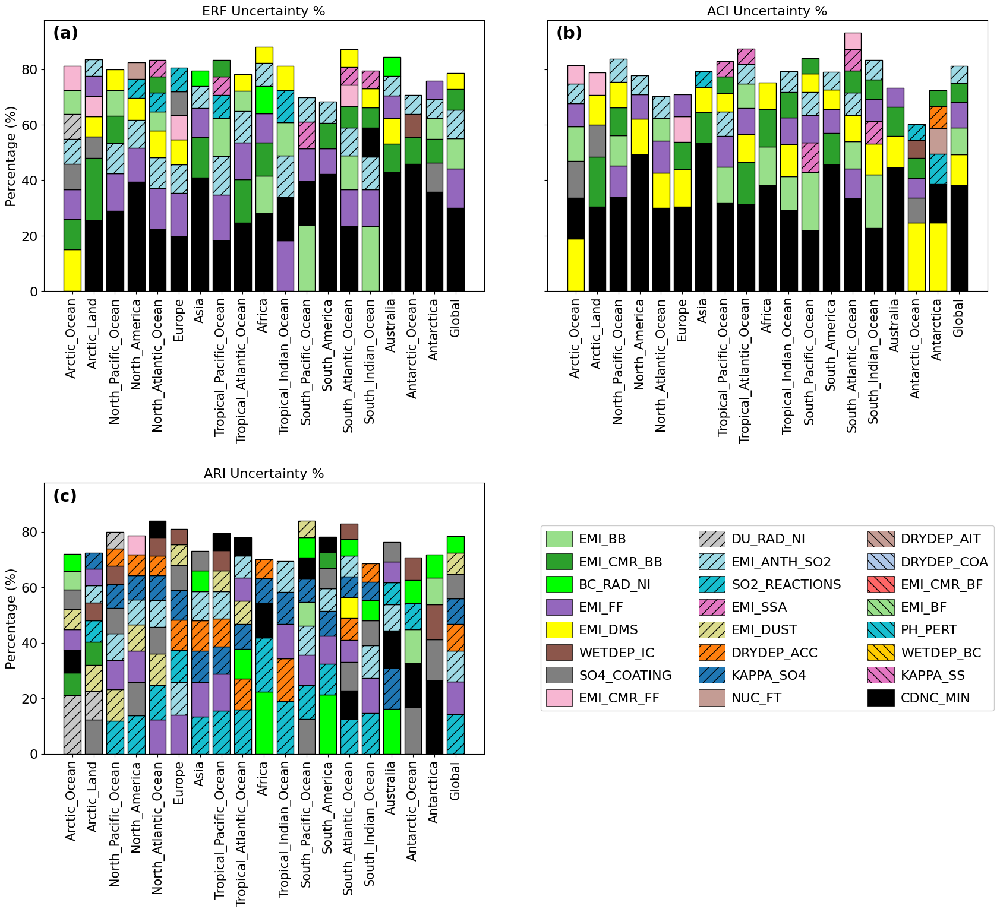

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
#table = pd.read_csv("/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/Table_of_Regional_Uncertainty_Variance_Total.csv")
table = pd.read_csv("/home/ybhatti/prjs1076/Processed_Data/Analysed_Data/New/Table_of_Regional_Uncertainty_Variance_Total_ERF.csv")

# Define the region order
region_order = ["NA", "Arctic_Ocean", "Arctic_Land", "North_Pacific_Ocean", "North_America", 
                "North_Atlantic_Ocean", "Europe", "Asia", "Tropical_Pacific_Ocean", 
                "Tropical_Atlantic_Ocean", "Africa", "Tropical_Indian_Ocean", 
                "South_Pacific_Ocean", "South_America", "South_Atlantic_Ocean", 
                "South_Indian_Ocean", "Australia", "Antarctic_Ocean", "Antarctica", "Global"]

# Select the top 5 variables for each region for all metrics
top_5_erf = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF")).reset_index(drop=True)
top_5_aci = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF_ACI")).reset_index(drop=True)
top_5_ari = table.groupby("Region").apply(lambda x: x.nlargest(24, "Uncertainty_ERF_ARI")).reset_index(drop=True)


# Filter out variables with uncertainty greater than 3%
top_5_erf = top_5_erf[top_5_erf["Uncertainty_ERF"] > 5.5]
top_5_aci = top_5_aci[top_5_aci["Uncertainty_ERF_ACI"] > 5.5]
top_5_ari = top_5_ari[top_5_ari["Uncertainty_ERF_ARI"] > 5.5]

# Apply the custom order to each dataset
for df in [top_5_erf, top_5_aci, top_5_ari]:
    df["Region"] = pd.Categorical(df["Region"], categories=region_order, ordered=True)
    df.sort_values(by="Region", inplace=True)

# Define variable order and colors
ordered_variables = [
    "EMI_BB", "EMI_CMR_BB", "BC_RAD_NI", "EMI_FF", "EMI_DMS", "WETDEP_IC", "SO4_COATING", "EMI_CMR_FF", 
    "DU_RAD_NI", "EMI_ANTH_SO2", "SO2_REACTIONS", "EMI_SSA", "EMI_DUST", "DRYDEP_ACC", "KAPPA_SO4", "NUC_FT", 
    "DRYDEP_AIT", "DRYDEP_COA", "EMI_CMR_BF", "EMI_BF", "PH_PERT", "WETDEP_BC", "KAPPA_SS","CDNC_MIN"
]

ordered_colors = [
    "#98df8a", "#2ca02c", "lime", "#9467bd", 
    "yellow", "#8c564b", "#7f7f7f", "#f7b6d2", "#c7c7c7",
    "#9edae5", "#17becf", "#e377c2", "#dbdb8d", "#ff7f0e",
    "#1f77b4", "#c49c94", "#c49c94", "#aec7e8", "#ff6666",
    "#98df8a", "#17becf", "#ffcc00", "#e377c2", "black"
]

# Combine variables used in all selections for a consistent legend
unique_variables = pd.concat([
    top_5_erf["Variable"], 
    top_5_aci["Variable"], 
    top_5_ari["Variable"]
]).unique()

# Sort variables within each region for stacking order
top_5_erf = top_5_erf.sort_values(by=["Region", "Uncertainty_ERF"], ascending=[True, False])
top_5_aci = top_5_aci.sort_values(by=["Region", "Uncertainty_ERF_ACI"], ascending=[True, False])
top_5_ari = top_5_ari.sort_values(by=["Region", "Uncertainty_ERF_ARI"], ascending=[True, False])


subplot_labels = ["(a)", "(b)", "(c)"]



color_map = {var: color for var, color in zip(ordered_variables, ordered_colors)}

fig, axes = plt.subplots(2, 2, figsize=(18, 16), sharey=True)

# Remove the bottom-right plot (axes[1, 1])
fig.delaxes(axes[1, 1])

plots = [
    (top_5_erf, "Uncertainty_ERF", "ERF Uncertainty %"),
    (top_5_aci, "Uncertainty_ERF_ACI", "ACI Uncertainty %"),
    (top_5_ari, "Uncertainty_ERF_ARI", "ARI Uncertainty %"),
]
hatch_map = {
    "DRYDEP_AIT": '\\\\',
    "DRYDEP_COA": '\\\\',
    "EMI_CMR_BF": '\\\\',
    "EMI_BF": '\\\\',
    "PH_PERT": '\\\\',
    "WETDEP_BC": '\\\\',
    "KAPPA_SS": '\\\\',
    "DU_RAD_NI": '//',
    "EMI_ANTH_SO2": '//',
    "SO2_REACTIONS": '//',
    "EMI_SSA": '//',
    "EMI_DUST": '//',
    "DRYDEP_ACC": '//',
    "KAPPA_SO4": '//'
}
# Plot each subplot
# Update the plotting loop to use consistent hatching
for ax, (data, metric, title), label in zip(axes.flat[:-1], plots, subplot_labels):
    for region in data["Region"].unique():
        region_data = data[data["Region"] == region]
        bottom = None
        for _, row in region_data.iterrows():
            hatch = hatch_map.get(row["Variable"], '')  # Get hatch pattern from map
            
            ax.bar(
                region,
                row[metric],
                bottom=bottom,
                color=color_map[row["Variable"]],
                hatch=hatch,
                edgecolor='black',
                #linewidth=0.5,  # Thinner edge lines
                label=row["Variable"] if row["Variable"] not in ax.get_legend_handles_labels()[1] else ""
            )
            bottom = bottom + row[metric] if bottom is not None else row[metric]
    ax.set_xticklabels(data["Region"].unique(), rotation=90, fontsize=15)  # Rotate x labels
    ax.set_title(title, fontsize=16)
    # Add subplot label at the top-left
    ax.text(0.02, 0.98, label, transform=ax.transAxes, fontsize=20, fontweight='bold', 
            va='top', ha='left')
    # Set y-axis ticks fontsize
axes[0][0].tick_params(axis='y', labelsize=16)
axes[1][0].tick_params(axis='y', labelsize=16)

# Set y-axis label
axes[0][0].set_ylabel("Percentage (%)", fontsize=16)
axes[1][0].set_ylabel("Percentage (%)", fontsize=16)

# Create legend in the bottom-right plot (axes[1, 1] which we'll recreate)
axes[1, 1] = fig.add_subplot(2, 2, 4)  # Recreate the bottom-right subplot

# Turn off axes for the legend plot
axes[1, 1].axis('off')

handles = []
for var in ordered_variables:
    hatch = hatch_map.get(var, '')
    patch = mpatches.Rectangle(
        (0, 0), 1, 1, 
        facecolor=color_map[var], 
        hatch=hatch,
        edgecolor='black',
        linewidth=0.5
    )
    handles.append(patch)

# Adjust legend parameters
axes[1, 1].legend(
    handles, 
    ordered_variables, 
    loc='center', 
    fontsize=16,  # Slightly smaller font for better fit
    handleheight=1.5, 
    framealpha=1, 
    ncol=3,
    handlelength=2,  # Longer handles for better hatch visibility
    handletextpad=0.5  # Less space between handle and text
)

# Adjust layout with more padding
plt.tight_layout(pad=3.0)

# Uncomment to save the figure
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/Regional_Uncertainty_Map_ERF_CDNC.png", dpi=100, bbox_inches='tight')
plt.savefig("/home/ybhatti/prjs1076/Plots/Manuscript/Figures/Regional_Uncertainty_Map_ERF_CDNC.pdf", dpi=100, bbox_inches='tight')
